<a href="https://colab.research.google.com/github/orellanomariana/Proyecto_DS2/blob/main/Entrega_Final_ORELLANO_MARIANA_DS2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

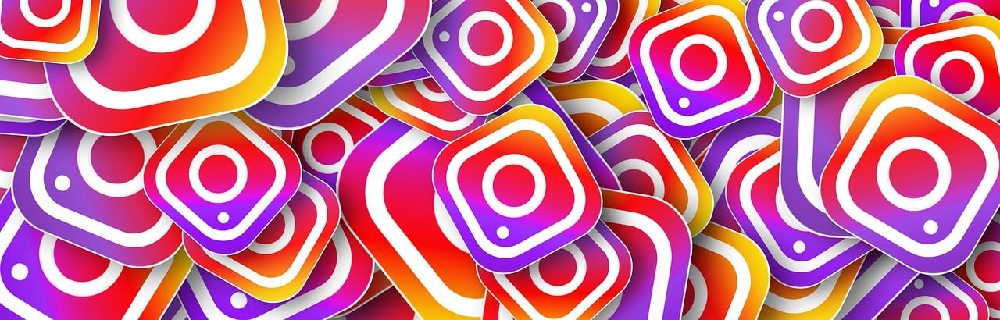

# **Maximizando el Engagement en Instagram: Análisis y Predicción**


# **Descripcion de objetivo, contexto  y problema comercial**


---



# ***Objetivo***

El objetivo de este proyecto es analizar y entender las métricas de interacción en Instagram para identificar qué características de las publicaciones aumentan el engagement (interacción y participación de los usuarios) y, en última instancia, optimizan la efectividad de las publicaciones promocionadas.

Este análisis permitirá  maximizar la inversión en Instagram, mejorando la  visibilidad y ventas.

Se busca desarrollar modelos predictivos y/o de clasificación que puedan ser utilizados tanto por usuarios finales que gestionan sus propias publicaciones como por agencias de marketing para apoyar sus estrategias.

#**Contexto Comercial**
En la actualidad, Instagram es una plataforma esencial para la comercialización de productos y servicios.
Con millones de usuarios activos diariamente, muchas personas utilizan Instagram como su principal fuente de búsqueda de productos y servicios, incluso por encima de plataformas tradicionales como Google Adwords.

Instagram ofrece un sistema de recomendacion de publicaciones para promocionar fácil de usar, muchas empresas y usuarios no logran obtener el máximo beneficio de estas inversiones debido a una falta de comprensión sobre qué características de las publicaciones generan mayor engagement.
Contratar agencias de marketing es una alternativa, pero puede ser costoso y no siempre accesible para todos los negocios.

#**Problema Comercial**
El principal problema comercial es la suboptimización de las inversiones en publicaciones promocionadas en Instagram.

A pesar de las recomendaciones de Instagram sobre qué publicaciones promocionar, muchas no alcanzan el engagement esperado.
Esto se debe a una falta de comprensión sobre las características que impulsan la interacción, como el contenido, los días y horarios de publicación, entre otros factores.
Sin una estrategia informada y basada en datos, las marcas no logran maximizar su visibilidad y, por ende, sus ventas.

Este proyecto busca abordar este problema proporcionando un análisis detallado y modelos predictivos y/o de clasificación que ayuden a seleccionar y optimizar las publicaciones para aumentar el engagement.

Estos modelos serán útiles tanto para los usuarios finales que gestionan sus propias publicaciones como para las agencias de marketing que buscan mejorar sus estrategias y resultados.


# **Preguntas Clave**




- ¿Qué tipo de publicaciones generan más engagement en Instagram?
¿Imágenes, videos o múltiples imágenes logran mayor interacción?

- ¿Cómo afecta el contenido textual al engagement?
¿La longitud y el sentimiento del texto influyen en la interacción?

- ¿Cuál es el mejor momento para publicar?
¿Existen días u horarios que generan mayor engagement?

- ¿Cómo se relacionan los seguidores con el engagement?
¿Las cuentas con más seguidores o las que siguen más cuentas obtienen mayor interacción?

- ¿Es posible predecir el engagement de una publicación?
¿Podemos construir un modelo que estime el engagement antes de publicar?









#**Hipotesis**



- Contenido multimedia (videos o múltiples imágenes) genera más engagement que solo imágenes.
- Textos cortos y positivos generan mayor engagement que textos largos o negativos/neutrales.
- Fines de semana producen más engagement que días entre semana.
- El número de seguidores no está directamente relacionado con el engagement por publicación.
- Un modelo predictivo puede estimar el engagement basado en características de la publicación.


# Carga de librerias necesarias

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly.express as px

from plotly.subplots import make_subplots
import plotly.graph_objects as go
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
import random
import re
!pip install emoji
import emoji
!pip install emoji
!pip install vaderSentiment

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer




sns.set_palette("rocket")
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)
instagram_colors = ['#F58529', '#833AB4', '#FEDA77', '#DD2A7B', '#D62976', '#E4405F']




# Carga de datos

In [ ]:

ruta = 'https://raw.githubusercontent.com/orellanomariana/Proyecto_DS2/main/instagram_data.csv'

df = pd.read_csv(ruta)
df.head()

,owner_id,owner_username,shortcode,is_video,caption,comments,likes,created_at,location,imageUrl,multiple_images,username,followers,following
0,36063641,christendominique,C3_GS1ASeWI,False,I’m a brunch & Iced Coffee girlie☕️🍳 \n\nTop @...,268,16382,1.709327e+09,NaN,https://instagram.flba2-1.fna.fbcdn.net/v/t39....,True,christendominique,2144626.0,1021.0
1,36063641,christendominique,C38ivgNS3IX,True,😮‍💨Brow tips I really wish I would have know w...,138,9267,1.709241e+09,NaN,https://instagram.flba2-1.fna.fbcdn.net/v/t51....,False,christendominique,2144626.0,1021.0
2,36063641,christendominique,C35-Dd9SO1b,True,OMG I can’t believe it’s already been 1 yr sin...,1089,10100,1.709155e+09,NaN,https://instagram.flba2-1.fna.fbcdn.net/v/t51....,False,christendominique,2144626.0,1021.0
3,36063641,christendominique,C33TadDMisq,True,90’s Glam was Pam! \n\nMakeup \n@smashboxcosme...,271,6943,1.709065e+09,NaN,https://instagram.flba2-1.fna.fbcdn.net/v/t51....,False,christendominique,2144626.0,1021.0
4,36063641,christendominique,C3s-Cm1yCba,True,Chiseled & Sculptured 🏛️\n\n Contour @westmana...,145,17158,1.708718e+09,NaN,https://instagram.flba2-1.fna.fbcdn.net/v/t51....,False,christendominique,2144626.0,1021.0


# Comprension de los datos

In [ ]:
# Obtener información básica del dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11692 entries, 0 to 11691
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   owner_id         11692 non-null  object 
 1   owner_username   11690 non-null  object 
 2   shortcode        11690 non-null  object 
 3   is_video         11690 non-null  object 
 4   caption          11531 non-null  object 
 5   comments         11690 non-null  object 
 6   likes            11690 non-null  object 
 7   created_at       11689 non-null  float64
 8   location         4523 non-null   object 
 9   imageUrl         11689 non-null  object 
 10  multiple_images  11689 non-null  object 
 11  username         9577 non-null   object 
 12  followers        9577 non-null   float64
 13  following        9577 non-null   float64
dtypes: float64(3), object(11)
memory usage: 1.2+ MB





# **Resumen de la Metadata:**


*   owner_id: Int (identificador único para el propietario de la cuenta de Instagram)

* owner_username: String (Nombre de usuario del propietario de la cuenta de
Instagram)
* shortcode: String (identificador único para la publicación)
* is_video: Booleano (Indicador si la publicación es un video o no)
* caption: String (Texto del título que acompaña a la publicación)
* comments: Int  (Número de comentarios en la publicación)
* likes: Int (número de me gusta en la publicación)
* created_at: Int (marca de tiempo que indica la hora de creación de la publicación)
* location: Int (ubicación asociada con la publicación, si existe alguna)
* imageUrl: Int (URL de la imagen asociada a la publicación)
* multiple_images: Booleano (Indicador si la publicación contiene múltiples imágenes)
* username: String (Nombre de usuario de la cuenta de Instagram)
* followers: Int (Número de seguidores de la cuenta de Instagram)
* following: Int (Número de cuentas que sigue la cuenta de Instagram)







  



In [ ]:
df.shape

(11692, 14)

In [ ]:
# Identificar valores nulos
df.isnull().sum()


,0
owner_id,0
owner_username,2
shortcode,2
is_video,2
caption,161
comments,2
likes,2
created_at,3
location,7169
imageUrl,3


In [ ]:
# identifiacion de columnas
df.columns

Index(['owner_id', 'owner_username', 'shortcode', 'is_video', 'caption',
       'comments', 'likes', 'created_at', 'location', 'imageUrl',
       'multiple_images', 'username', 'followers', 'following'],
      dtype='object')

# Limpieza de los datos

# Seleccion de columnas de interes a partir de la comprension de los datos
no se consideran las columnas :
- shortcode (no aporta dato interesante)
- location (tiene muchos nulos)
- imageUrl (no funciona el vinculo)
- username(dato repetido)
- owner_id
- owner_username

In [ ]:

df_filtrado = df[[ 'is_video','caption', 'comments', 'likes', 'created_at', 'multiple_images', 'followers', 'following' ]]
df_filtrado.head()

,is_video,caption,comments,likes,created_at,multiple_images,followers,following
0,False,I’m a brunch & Iced Coffee girlie☕️🍳 \n\nTop @...,268,16382,1.709327e+09,True,2144626.0,1021.0
1,True,😮‍💨Brow tips I really wish I would have know w...,138,9267,1.709241e+09,False,2144626.0,1021.0
2,True,OMG I can’t believe it’s already been 1 yr sin...,1089,10100,1.709155e+09,False,2144626.0,1021.0
3,True,90’s Glam was Pam! \n\nMakeup \n@smashboxcosme...,271,6943,1.709065e+09,False,2144626.0,1021.0
4,True,Chiseled & Sculptured 🏛️\n\n Contour @westmana...,145,17158,1.708718e+09,False,2144626.0,1021.0


# Manejo de nulos

<Axes: >

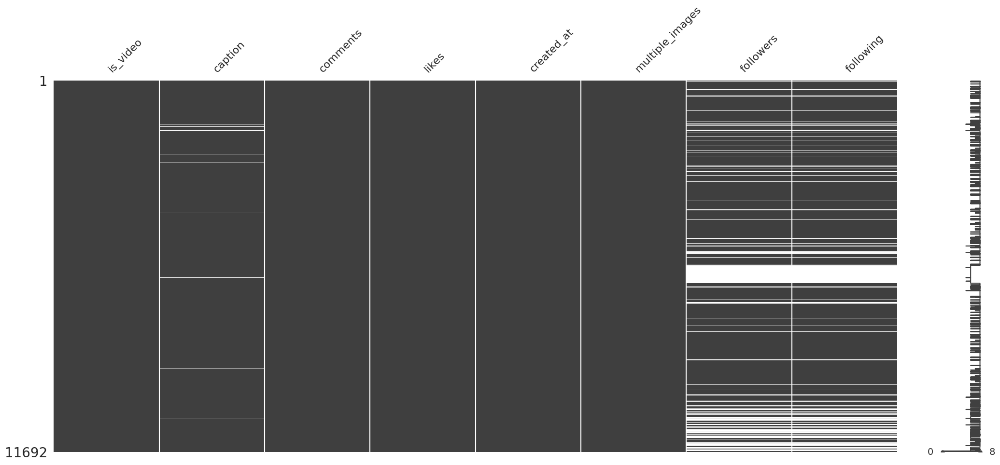

In [ ]:
#evaluo nulos en columnas de interes

msno.matrix(df_filtrado)

In [ ]:
df_filtrado.info() #evaluo el df filtrado con las columnas de interes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11692 entries, 0 to 11691
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   is_video         11690 non-null  object 
 1   caption          11531 non-null  object 
 2   comments         11690 non-null  object 
 3   likes            11690 non-null  object 
 4   created_at       11689 non-null  float64
 5   multiple_images  11689 non-null  object 
 6   followers        9577 non-null   float64
 7   following        9577 non-null   float64
dtypes: float64(3), object(5)
memory usage: 730.9+ KB


In [ ]:
df_filtrado.isnull().sum()

,0
is_video,2
caption,161
comments,2
likes,2
created_at,3
multiple_images,3
followers,2115
following,2115


Se debe definir que decision tomar con las filas que contienen nulos:


*   'is_video', 'comments', 'likes', 'created_at', 'multiple_images'en esta columnas los nan son 2 o 3 por lo que se decide borrar las filas
*   'captions' si bien quizas se realice el analisis del texto se podria hacer con un filtrado del dataset, para no perder estas filas se completara con 'neutral, no caption'
*   'followers' y 'following' tienen ambas 2115 nan se evaluara si reeemplazarlos por media o mediana






In [ ]:
df_filtrado = df_filtrado.dropna(subset=['is_video', 'comments', 'likes', 'created_at', 'multiple_images', 'caption'])


In [ ]:
# Contar valores nulos antes del reemplazo
nulos_antes = df_filtrado['caption'].isnull().sum()

# Reemplazar valores nulos
df_filtrado['caption'].fillna('neutral, no caption', inplace=True)

# Contar valores nulos después del reemplazo
nulos_despues = df_filtrado['caption'].isnull().sum()

# Calcular cuántos valores fueron reemplazados
reemplazados = nulos_antes - nulos_despues
print(f"Número de valores reemplazados en 'caption': {reemplazados}")


Número de valores reemplazados en 'caption': 0


In [ ]:
# Reemplazar valores nulos en la columna 'caption' con el string 'neutral, no caption'
#df_filtrado['caption'].fillna('neutral, no caption', inplace=True)
#df_filtrado['caption'] = df_filtrado['caption'].fillna('neutral, no caption')


In [ ]:
df_filtrado.shape

(11530, 8)

ANALISIS DE LOS FOLLOWINGS

In [ ]:
#FOLLOWINGS  evaluacion para definir con que valor se reemplazan los nan

mean_following = df_filtrado['following'].mean()
median_following = df_filtrado['following'].median()
print(f"Media de following: {mean_following}")
print(f"Mediana de following: {median_following}")


Media de following: 4992.074462451012
Mediana de following: 689.0


<ipython-input-17-036bca0c61e8>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_filtrado['following'], palette=instagram_colors)
<ipython-input-17-036bca0c61e8>:7: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.boxplot(x=df_filtrado['following'], palette=instagram_colors)


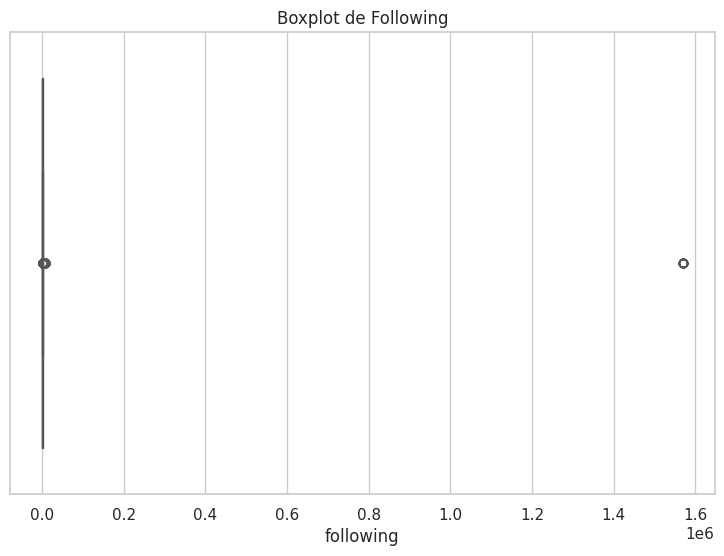

In [ ]:
#son valores MUY distintos
#se debe evaluar la distribucion de los datos para elegir la media o la mediana

#  realizo un Boxplot para visualizar outliers en 'following'
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 2)
sns.boxplot(x=df_filtrado['following'], palette=instagram_colors)
plt.title('Boxplot de Following')
plt.show()


In [ ]:
#chequeo valor maximo de following
maximo_following = df_filtrado['following'].max()
maximo_following

1568394.0

In [ ]:
#chequeo valor minimo de following
minimo_following = df_filtrado['following'].min()
minimo_following

0.0


como el primer grafico no me muestra ningun dato util limito el eje x para facilitar la visualizacion de los datos
evaluo previamente minimo y maximo
Realizo un Boxplot para visualizar outliers en 'following' con límite en el eje x

<ipython-input-20-1fc34e236b7c>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_filtrado['following'], palette=instagram_colors)
<ipython-input-20-1fc34e236b7c>:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.boxplot(x=df_filtrado['following'], palette=instagram_colors)


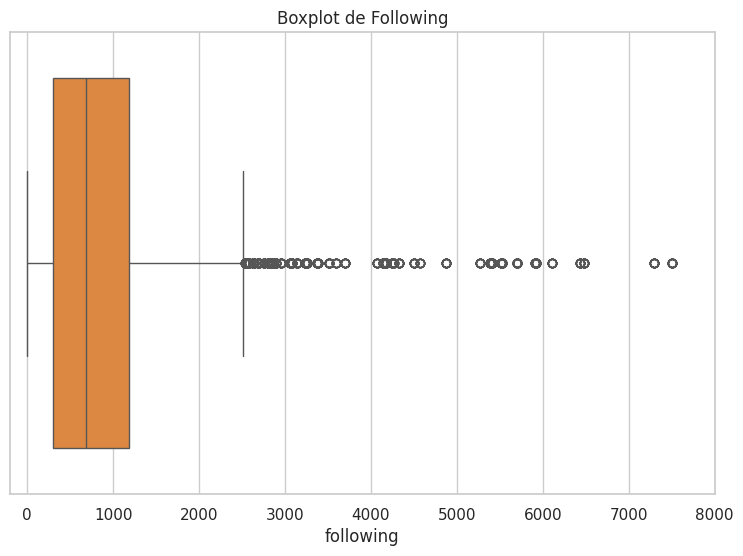

In [ ]:
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 2)
sns.boxplot(x=df_filtrado['following'], palette=instagram_colors)
plt.title('Boxplot de Following')
plt.xlim(-200, 8000)  # fui ajustando este limite en funcion de la visualizacion



plt.show()


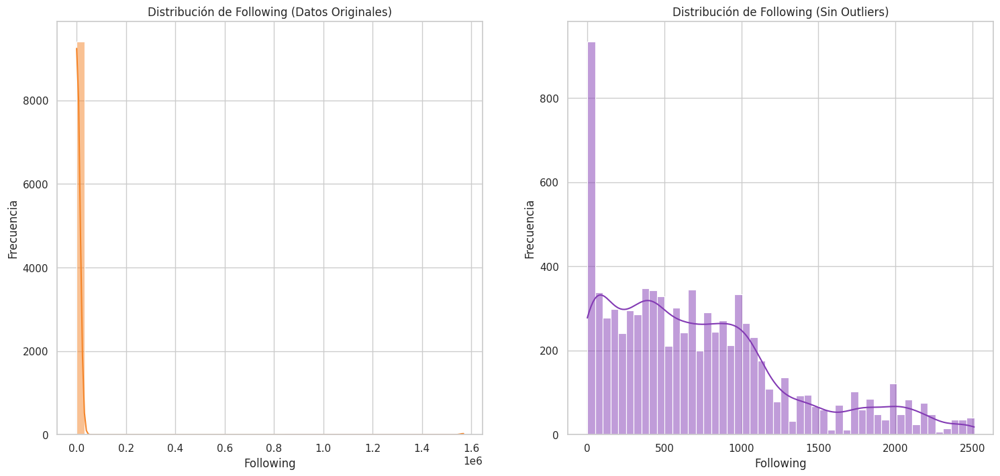

In [ ]:
#Grafico de distribucion con y sin outliers

Q1 = df_filtrado['following'].quantile(0.25)
Q3 = df_filtrado['following'].quantile(0.75)
IQR = Q3 - Q1
limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR
outliers = (df_filtrado['following'] < limite_inferior) | (df_filtrado['following'] > limite_superior)

data_sin_outliers = df_filtrado[~outliers]['following']

plt.figure(figsize=(18, 8))

plt.subplot(1, 2, 1)
sns.histplot(df_filtrado['following'], bins=50, kde=True, color=instagram_colors[0])
plt.title('Distribución de Following (Datos Originales)')
plt.xlabel('Following')
plt.ylabel('Frecuencia')

plt.subplot(1, 2, 2)
sns.histplot(data_sin_outliers, bins=50, kde=True, color=instagram_colors[1])
plt.title('Distribución de Following (Sin Outliers)')
plt.xlabel('Following')
plt.ylabel('Frecuencia')

plt.show()


In [ ]:
#Evaluacion de cantidad de outliers, % del total y frecuencia de los followings
Q1 = df_filtrado['following'].quantile(0.25)
Q3 = df_filtrado['following'].quantile(0.75)
IQR = Q3 - Q1

limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR
outliers = (df_filtrado['following'] < limite_inferior) | (df_filtrado['following'] > limite_superior)

num_outliers = outliers.sum()
total_data_points = len(df_filtrado)

proporcion_outliers = num_outliers / total_data_points

print(f"Número de outliers en 'following': {num_outliers}")
print(f"Proporción de outliers respecto al total de datos: {proporcion_outliers:.2%}")

frecuencia_outliers = df_filtrado[outliers]['following'].value_counts()

print("Frecuencia de los outliers:")
print(frecuencia_outliers)


Número de outliers en 'following': 802
Proporción de outliers respecto al total de datos: 6.96%
Frecuencia de los outliers:
3245.0       24
2866.0       24
3145.0       24
5921.0       24
3517.0       24
3258.0       24
2583.0       24
2753.0       24
1568394.0    24
5405.0       24
5698.0       24
5527.0       22
2955.0       22
4137.0       22
7508.0       20
4174.0       20
2827.0       14
5530.0       12
6479.0       12
2639.0       12
3086.0       12
2640.0       12
2811.0       12
3060.0       12
5266.0       12
2632.0       12
2625.0       12
5911.0       12
2802.0       12
2891.0       12
4245.0       12
2554.0       12
3702.0       12
5385.0       12
7298.0       12
4327.0       12
4069.0       12
2536.0       12
4873.0       12
2692.0       12
4500.0       12
3373.0       12
5706.0       12
5513.0       11
6111.0       11
2693.0       11
6431.0       11
3237.0       10
2836.0       10
3135.0       10
3380.0       10
3589.0       10
4576.0        7
4266.0        5
Name: follow

En base a los resultados obtenidos: el mejor criterio para rellenar los nan es utilizar la mediana ya que la distribucion es asimetrica

Utilizando el criterio de reemplazar los nan por la mediana en base a la distribucion, se utilizaran para el calculo de esta mediana los datos sin los outliers, luego estos datos considerados outliers en principio no se eliminaran del dataset ya que si bien sin datos extremos no hay nada que en principio indiquen que son erroneos, si a posterior se observa que generan ruido, si evaluara si deben considerarse o no

In [ ]:
#calculo de mediana de followings sin outliers
data_sin_outliers = df_filtrado[~outliers]['following']
median_following_sin_outliers = data_sin_outliers.median()
median_following_sin_outliers

623.0

In [ ]:
#reemplazar nan de followings por mediana sin contemplar los outliers

df_filtrado['following'].fillna(median_following_sin_outliers, inplace=True)


FOLLOWERS - REALIZO EL MISMO PROCESO

In [ ]:
#Calculo de media y mediana de followers incluyendo datos completos
mean_followers = df_filtrado['followers'].mean()
median_followers = df_filtrado['followers'].median()

print(f"Media de followers: {mean_followers}")
print(f"Mediana de followers: {median_followers}")

Media de followers: 2480882.5182713694
Mediana de followers: 525618.0


<ipython-input-26-2277fdcbe6d2>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_filtrado['followers'], palette=instagram_colors)
<ipython-input-26-2277fdcbe6d2>:7: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.boxplot(x=df_filtrado['followers'], palette=instagram_colors)


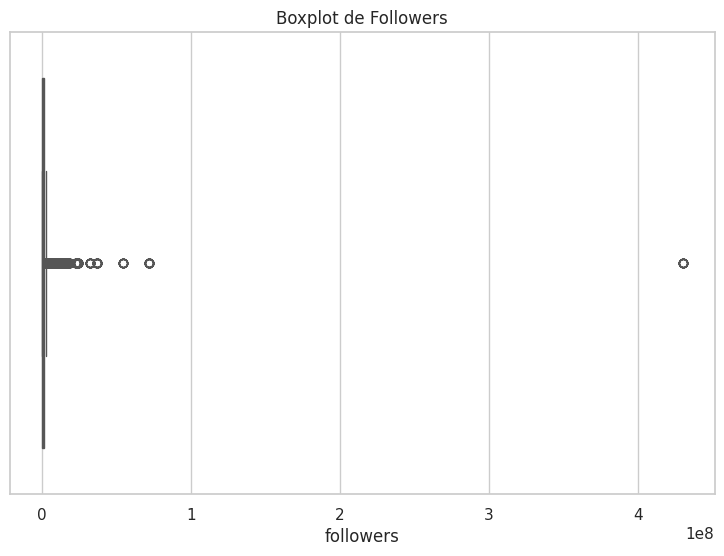

In [ ]:
#son valores MUY distintos
#se debe evaluar la distribucion de los datos para elegir la media o la mediana

#  realizo un Boxplot para visualizar outliers en 'follolwers'
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 2)
sns.boxplot(x=df_filtrado['followers'], palette=instagram_colors)
plt.title('Boxplot de Followers')
plt.show()


In [ ]:
#Chequeo maximo de followers
maximo_followers = df_filtrado['followers'].max()
maximo_followers

429831091.0

In [ ]:
#Chequeo minimo de followers
minimo_followers = df_filtrado['followers'].min()
minimo_followers

1.0

<ipython-input-29-c7e8226e48aa>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df_filtrado['followers'], palette=instagram_colors)
<ipython-input-29-c7e8226e48aa>:6: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.boxplot(x=df_filtrado['followers'], palette=instagram_colors)


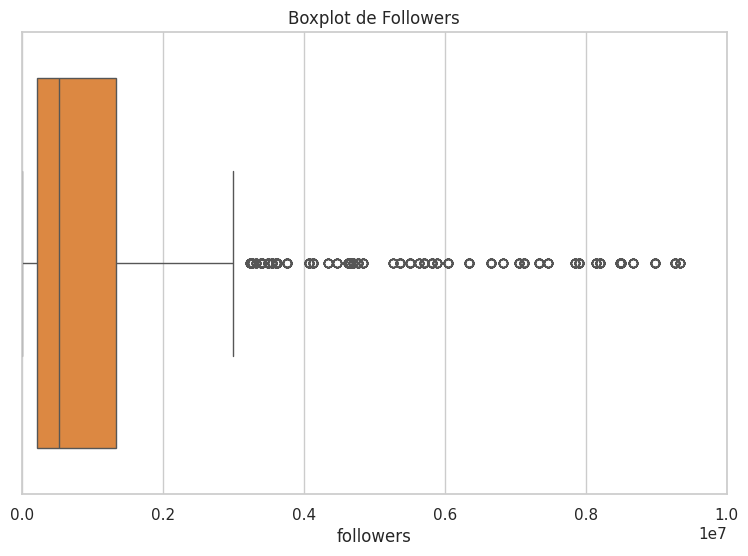

In [ ]:
# como el primer grafico no me muestra ningun dato util limito el eje x
#evaluo previamente minimo y maximo
# Boxplot para visualizar outliers en 'following' con límite en el eje x
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 2)
sns.boxplot(x=df_filtrado['followers'], palette=instagram_colors)
plt.title('Boxplot de Followers')
plt.xlim(0, 10000000)  # fui ajustando este limite en funcion de la visualizacion

plt.show()


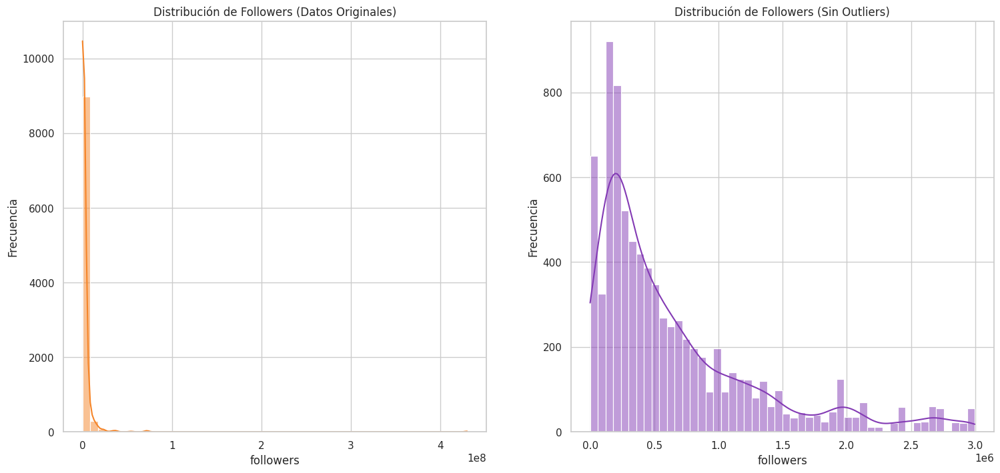

In [ ]:
#Distribucion de followers con y sin outliers
Q1 = df_filtrado['followers'].quantile(0.25)
Q3 = df_filtrado['followers'].quantile(0.75)
IQR = Q3 - Q1

limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

outliers = (df_filtrado['followers'] < limite_inferior) | (df_filtrado['followers'] > limite_superior)

data_sin_outliers = df_filtrado[~outliers]['followers']
plt.figure(figsize=(18, 8))

plt.subplot(1, 2, 1)
sns.histplot(df_filtrado['followers'], bins=50, kde=True,  color=instagram_colors[0])
plt.title('Distribución de Followers (Datos Originales)')
plt.xlabel('followers')
plt.ylabel('Frecuencia')

plt.subplot(1, 2, 2)
sns.histplot(data_sin_outliers, bins=50, kde=True,  color=instagram_colors[1])
plt.title('Distribución de Followers (Sin Outliers)')
plt.xlabel('followers')
plt.ylabel('Frecuencia')

plt.show()


In [ ]:
#Evaluacion de cantidad de outliers, % del total y frecuencia de los followers
Q1 = df_filtrado['followers'].quantile(0.25)
Q3 = df_filtrado['followers'].quantile(0.75)
IQR = Q3 - Q1

limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

outliers = (df_filtrado['followers'] < limite_inferior) | (df_filtrado['followers'] > limite_superior)

num_outliers = outliers.sum()
total_data_points = len(df_filtrado)


proporcion_outliers = num_outliers / total_data_points

print(f"Número de outliers en 'followers': {num_outliers}")
print(f"Proporción de outliers respecto al total de datos: {proporcion_outliers:.2%}")

frecuencia_outliers = df_filtrado[outliers]['followers'].value_counts()

print("Frecuencia de los outliers:")
print(frecuencia_outliers)


Número de outliers en 'followers': 1207
Proporción de outliers respecto al total de datos: 10.47%
Frecuencia de los outliers:
6651434.0     24
5700801.0     24
3388269.0     24
5505239.0     24
3267993.0     24
              ..
10203258.0    10
4465420.0     10
3321881.0      8
5259932.0      8
5634830.0      8
Name: followers, Length: 69, dtype: int64


El caso es similar a lo observo con los followings, estos "outliers" son un 10.40 % de los datos, pero siendo que se repiten no son datos erroneos sino extremos en funcion del resto, se aplica el mismo criterio se calcula la mediana con los datos sin contemplar los valores extremos y se reemplazan los nan por esta mediana calculada sin eliminar del datframe estas filas

In [ ]:
#calculo de mediana de followers sin outliers
data_sin_outliers = df_filtrado[~outliers]['followers']
median_followers_sin_outliers = data_sin_outliers.median()
#median_followers_sin_outliers = median_followers_sin_outliers.astype(int)
median_followers_sin_outliers

425289.0

In [ ]:
#reemplazar nan de followers por mediana sin contemplar los outliers

df_filtrado['followers'].fillna(median_followers_sin_outliers, inplace=True)


In [ ]:
df_filtrado.isnull().sum() #chequeo que no queden mas nulos

,0
is_video,0
caption,0
comments,0
likes,0
created_at,0
multiple_images,0
followers,0
following,0


# Transformacion de Datos

In [ ]:
df_filtrado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11530 entries, 0 to 11690
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   is_video         11530 non-null  object 
 1   caption          11530 non-null  object 
 2   comments         11530 non-null  object 
 3   likes            11530 non-null  object 
 4   created_at       11530 non-null  float64
 5   multiple_images  11530 non-null  object 
 6   followers        11530 non-null  float64
 7   following        11530 non-null  float64
dtypes: float64(3), object(5)
memory usage: 810.7+ KB


In [ ]:
print(df_filtrado['is_video'].unique()) #verifico los valores


['False' 'True']


In [ ]:
# se detectaron problemas en la conversion de is video a booleno, se agrega esta linea para corregirlo
df_filtrado['is_video'] = df_filtrado['is_video'].replace({'True': True, 'False': False, True: True, False: False, 1: True, 0: False})

In [ ]:
#conversion de datos
df_filtrado['is_video'] = df_filtrado['is_video'].astype(bool)
df_filtrado['multiple_images'] = df_filtrado['multiple_images'].astype(bool)
df_filtrado['comments'] = pd.to_numeric(df_filtrado['comments'], errors='coerce')
df_filtrado['likes'] = pd.to_numeric(df_filtrado['likes'], errors='coerce')
df_filtrado['followers'] = pd.to_numeric(df_filtrado['followers'], errors='coerce')
df_filtrado['following'] = pd.to_numeric(df_filtrado['following'], errors='coerce')
df_filtrado['created_at'] = pd.to_datetime(df_filtrado['created_at'], unit='s')  #convierto a data time



In [ ]:
print(df_filtrado['is_video'].unique()) #verifico los booleanos

[False  True]


In [ ]:
print(df_filtrado['multiple_images'].unique()) #verifico los booleanos

[ True False]


# Enriquecimiento de los datos

In [ ]:
#analisis de sentimiento de los captions


def clean_text(text):
    text = emoji.demojize(text, delimiters=(" ", " "))
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'@\w+|#\w+', '', text)
    text = re.sub(r'[^A-Za-z0-9\s]', '', text.lower())
    text = re.sub(r'\s+', ' ', text).strip()
    return text


df_filtrado['clean_caption'] = df_filtrado['caption'].apply(clean_text)
analyzer = SentimentIntensityAnalyzer()

def analyze_sentiment(text):
    score = analyzer.polarity_scores(text)
    if score['compound'] >= 0.05:
        return 'positive'
    elif score['compound'] <= -0.05:
        return 'negative'
    else:
        return 'neutral'


df_filtrado['sentiment'] = df_filtrado['clean_caption'].apply(analyze_sentiment)



In [ ]:
# Contar la cantidad de entradas de cada tipo de sentimiento
sentiment_counts = df_filtrado['sentiment'].value_counts()
print(sentiment_counts)


positive    6308
neutral     4087
negative    1135
Name: sentiment, dtype: int64


In [ ]:
#calculo del engagement , tasa de interacción ESTA VA A SER MI VARIABLE OBJETIVO
df_filtrado['engagement_rate'] = (df_filtrado['likes'] + df_filtrado['comments']) / df_filtrado['followers'] * 100


In [ ]:
#hora del dia
df_filtrado['hour_of_day'] = df_filtrado['created_at'].dt.hour


In [ ]:
#dia de la semana
df_filtrado['day_of_week'] = df_filtrado['created_at'].dt.day_name()


In [ ]:
# Eliminar y reordenar columnas
df_filtrado.drop([ 'caption'], axis=1, inplace=True)

column_order = [
     'clean_caption', 'sentiment', 'is_video','multiple_images',
    'comments', 'likes', 'engagement_rate',  'followers',
    'following',  'created_at', 'hour_of_day', 'day_of_week'
]

df_filtrado = df_filtrado[column_order]

df_filtrado.head()


,clean_caption,sentiment,is_video,multiple_images,comments,likes,engagement_rate,followers,following,created_at,hour_of_day,day_of_week
0,im a brunch iced coffee girlie hotbeverage coo...,positive,False,True,268,16382,0.776359,2144626.0,1021.0,2024-03-01 20:59:18,20,Friday
1,faceexhaling brow tips i really wish i would h...,positive,True,False,138,9267,0.438538,2144626.0,1021.0,2024-02-29 21:10:48,21,Thursday
2,omg i cant believe its already been 1 yr since...,positive,True,False,1089,10100,0.521723,2144626.0,1021.0,2024-02-28 21:11:47,21,Wednesday
3,90s glam was pam makeup og primer always on fo...,neutral,True,False,271,6943,0.336376,2144626.0,1021.0,2024-02-27 20:22:02,20,Tuesday
4,chiseled sculptured classicalbuilding contour ...,neutral,True,False,145,17158,0.806807,2144626.0,1021.0,2024-02-23 20:01:26,20,Friday


In [ ]:
df_filtrado.shape

(11530, 12)

# EDA CON DATAPREP

Realizo un Eda con dataprep para tener un primer pantallazo de como estan mis variables y luego desarrollar mi Eda personalizado

In [ ]:
!pip install dataprep

Computing series-var-1d-1de119bf6f6c65177a19665bab44a4b2:  79%|███████▊  | 1308/1664 [00:00<00:00, 1432.59it/s] /usr/local/lib/python3.10/dist-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))


DataPrep Report
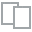
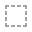
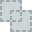
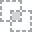
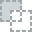
...
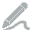
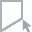
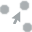
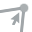
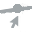

In [ ]:
from dataprep.eda import create_report
#Creating report

report = create_report(df_filtrado)
report

## **Manejo de Outliers**

In [ ]:
df_copia = df_filtrado.copy()


Como la variable objetivo es el nivel del engagement, hago un describe para ver sus valores, y poder agregar la columna como variable categorica, a posterior de definira si se planteara un problema de regresion o de clasificacion al momento de aplicar los modelos

In [ ]:

df_copia['engagement_rate'].describe()



,engagement_rate
count,11530.000000
mean,3.419493
std,19.331675
min,0.000000
25%,0.167244
50%,0.493328
75%,1.470535
max,653.932584


In [ ]:

bins = [0, 0.20, 0.50, 1, df_copia['engagement_rate'].max()]
labels = ['Bajo', 'Medio', 'Alto', 'Muy Alto']
df_copia['engagement_rate_category'] = pd.cut(df_copia['engagement_rate'], bins=bins, labels=labels, include_lowest=True)

print(df_copia['engagement_rate_category'].value_counts())



Muy Alto    3843
Bajo        3328
Medio       2488
Alto        1871
Name: engagement_rate_category, dtype: int64


<ipython-input-53-7a4b0ee51a1f>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_copia, x='engagement_rate_category', palette=instagram_colors, order=['Bajo', 'Medio', 'Alto', 'Muy Alto'])
<ipython-input-53-7a4b0ee51a1f>:3: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.countplot(data=df_copia, x='engagement_rate_category', palette=instagram_colors, order=['Bajo', 'Medio', 'Alto', 'Muy Alto'])


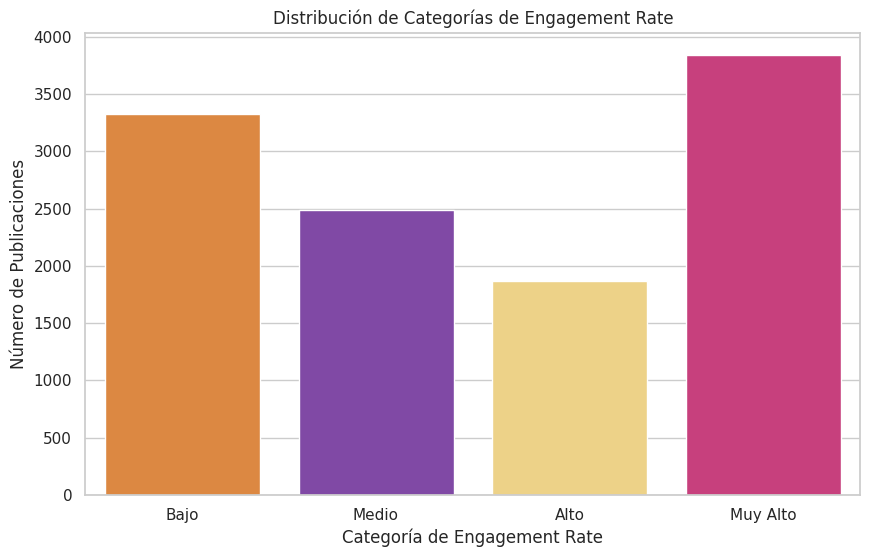

In [ ]:
# Crear el gráfico de barras para la variable categórica con los nuevos rangos
plt.figure(figsize=(10, 6))
sns.countplot(data=df_copia, x='engagement_rate_category', palette=instagram_colors, order=['Bajo', 'Medio', 'Alto', 'Muy Alto'])

plt.title('Distribución de Categorías de Engagement Rate')
plt.xlabel('Categoría de Engagement Rate')
plt.ylabel('Número de Publicaciones')

plt.show()




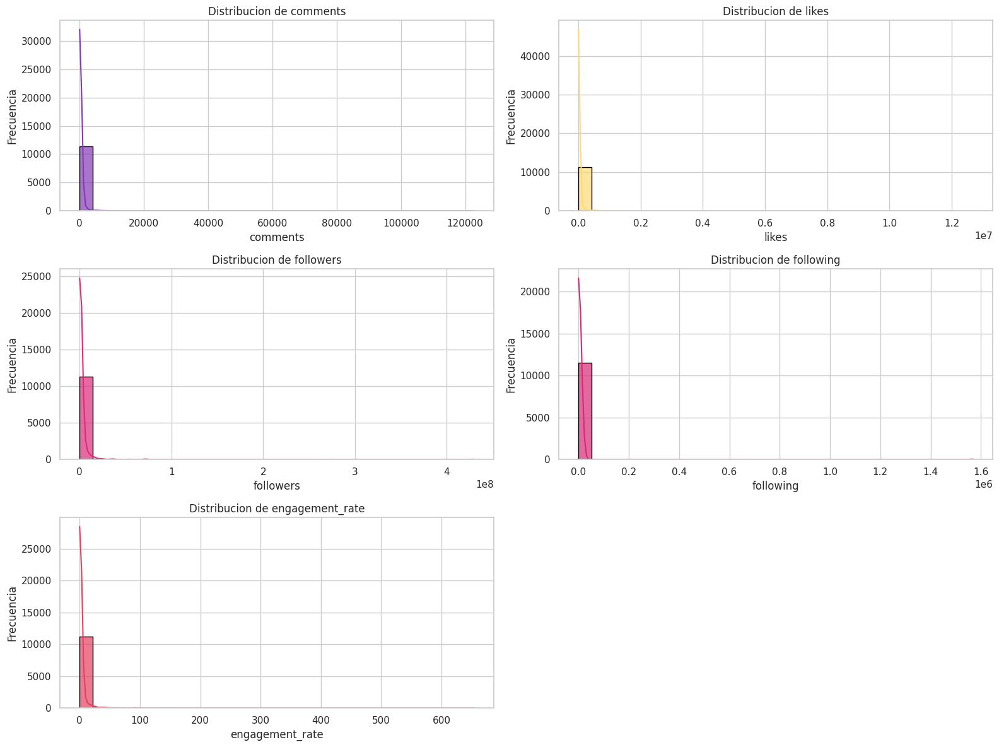

In [ ]:

columns_to_plot = ['comments', 'likes', 'followers', 'following', 'engagement_rate']


plt.figure(figsize=(16, 12))

for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(3, 2, i)
    sns.histplot(df_copia[column].dropna(), kde=True, bins=30, edgecolor='black', alpha=0.7, color=instagram_colors[i % len(instagram_colors)])
    plt.title(f'Distribucion de {column}')
    plt.xlabel(column)
    plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()

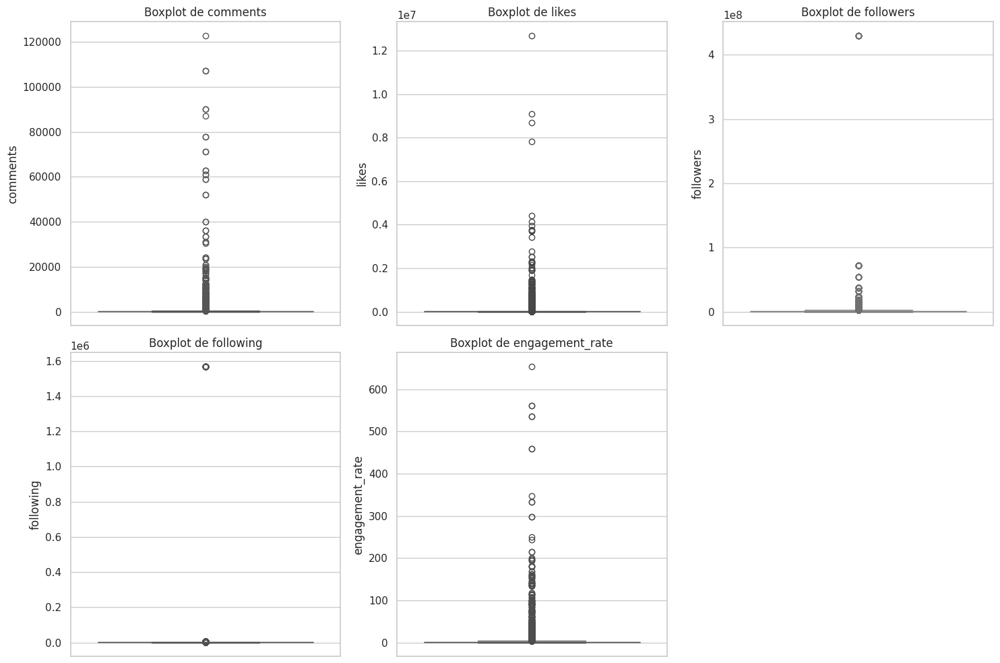

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(15, 10))

for i, col in enumerate(['comments', 'likes', 'followers', 'following', 'engagement_rate']):
    plt.subplot(2, 3, i + 1)
    sns.boxplot(data=df_copia, y=col, color=instagram_colors[i % len(instagram_colors)])
    plt.title(f'Boxplot de {col}')

plt.tight_layout()
plt.show()


Tras realizar el EDA con Dataprep y analizar las variables comments, likes, followers, following y engagement_rate mediante gráficos como displot y boxplot, se identificaron valores extremos superiores (outliers) que dificultaban la visualización clara de las distribuciones y relaciones entre las variables. Por ello, se procedió a limpiar estos outliers para mejorar la interpretación de los datos.




In [ ]:
def remove_outliers(df, column):
    Q1 = df_copia[column].quantile(0.25)
    Q3 = df_copia[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

for col in ['comments', 'likes', 'followers', 'following', 'engagement_rate']:
    df_copia = remove_outliers(df_copia, col)


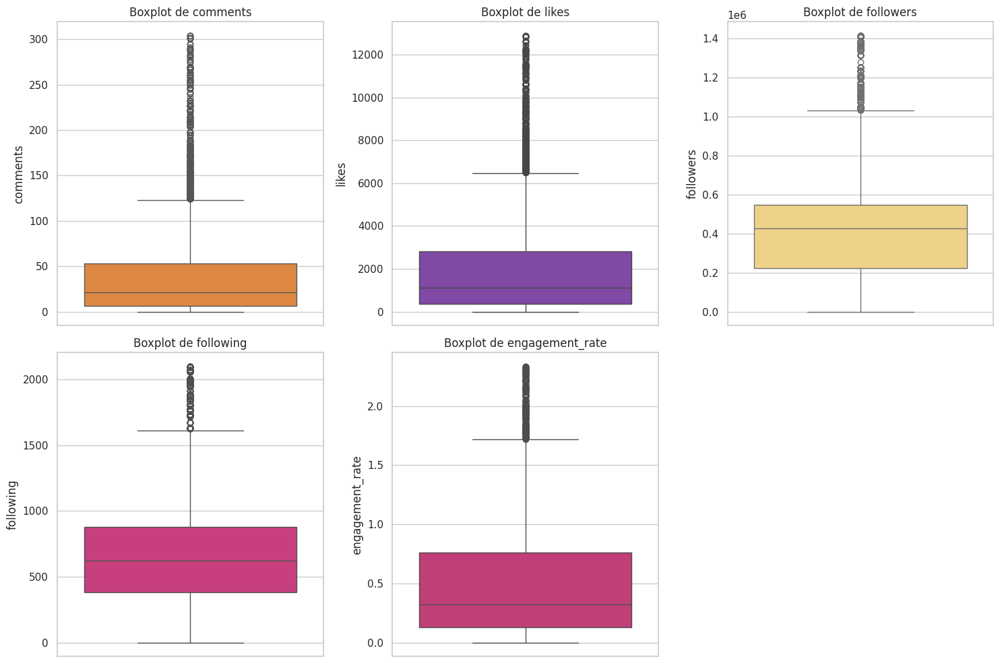

In [ ]:

plt.figure(figsize=(15, 10))


for i, col in enumerate(['comments', 'likes', 'followers', 'following', 'engagement_rate']):
    plt.subplot(2, 3, i + 1)
    sns.boxplot(data=df_copia, y=col, color=instagram_colors[i % len(instagram_colors)])
    plt.title(f'Boxplot de {col}')

plt.tight_layout()
plt.show()

Luego de la limpieza de los datos realizada, considero que el dataset está en condiciones óptimas para proceder con el Análisis Exploratorio de Datos (EDA). Este análisis nos permitirá profundizar en las relaciones entre las variables y sentar las bases para el desarrollo de modelos predictivos que optimicen las estrategias de engagement.




In [ ]:
print(f'Número de filas después de eliminar outliers: {df_copia.shape[0]}')


Número de filas después de eliminar outliers: 6394


In [ ]:
df_copia.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6394 entries, 12 to 11690
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   clean_caption             6394 non-null   object        
 1   sentiment                 6394 non-null   object        
 2   is_video                  6394 non-null   bool          
 3   multiple_images           6394 non-null   bool          
 4   comments                  6394 non-null   int64         
 5   likes                     6394 non-null   int64         
 6   engagement_rate           6394 non-null   float64       
 7   followers                 6394 non-null   float64       
 8   following                 6394 non-null   float64       
 9   created_at                6394 non-null   datetime64[ns]
 10  hour_of_day               6394 non-null   int64         
 11  day_of_week               6394 non-null   object        
 12  engagement_rate_ca

# EDA

# Analisis Univariado, Bivariado y  Multivariado

Computing getitem-97c48ac7ee1d61aee743d8e647f490bd:  76%|███████▌  | 1332/1754 [00:01<00:00, 605.00it/s]        /usr/local/lib/python3.10/dist-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))


DataPrep Report
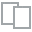
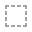
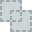
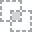
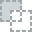
...
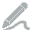
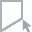
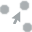
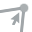
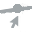

In [ ]:
report = create_report(df_copia)

report

In [ ]:
df_copia.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6394 entries, 12 to 11690
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   clean_caption             6394 non-null   object        
 1   sentiment                 6394 non-null   object        
 2   is_video                  6394 non-null   bool          
 3   multiple_images           6394 non-null   bool          
 4   comments                  6394 non-null   int64         
 5   likes                     6394 non-null   int64         
 6   engagement_rate           6394 non-null   float64       
 7   followers                 6394 non-null   float64       
 8   following                 6394 non-null   float64       
 9   created_at                6394 non-null   datetime64[ns]
 10  hour_of_day               6394 non-null   int64         
 11  day_of_week               6394 non-null   object        
 12  engagement_rate_ca

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Definir los colores de Instagram
instagram_colors = ['#F58529', '#FEDA77', '#DD2A7B', '#D62976', '#E4405F', '#833AB4']

columns_to_plot = ['comments', 'likes', 'followers', 'following', 'engagement_rate', 'sentiment']

fig = make_subplots(rows=3, cols=2, subplot_titles=columns_to_plot)

for i, column in enumerate(columns_to_plot, 1):

    row = (i - 1) // 2 + 1
    col = (i - 1) % 2 + 1


    color = instagram_colors[i - 1]


    if column != 'sentiment':
        fig.add_trace(
            go.Histogram(
                x=df_copia[column],
                nbinsx=30,
                name=column,
                marker=dict(color=color, line=dict(color='black', width=1))
            ),
            row=row, col=col
        )
    else:
        fig.add_trace(
            go.Histogram(
                x=df_copia[column],
                name=column,
                marker=dict(color=color, line=dict(color='black', width=1))
            ),
            row=row, col=col
        )

fig.update_layout(height=800, width=1000, title_text="Distribución de variables", showlegend=False)
fig.update_xaxes(title_text='Valores')
fig.update_yaxes(title_text='Frecuencia')

fig.show()


Tras la visualización de las distribuciones de las principales variables, se identificó que la mayoría presentan un sesgo hacia la izquierda, lo que indica que la mayor parte de las publicaciones tienen interacciones relativamente bajas, mientras que un pequeño porcentaje concentra altos niveles de likes, comentarios, y tasas de engagement.
En la limpieza anterior ya se eliminaron los Outliers que no permitian observar con claridad la distribucion de los datos
La mayoria de las publicaciones contienen en sus captions un sentimiento positivo



**Engagement en funcion al tipo de publicacion**
--

In [ ]:

df_copia['tipo_publicacion'] = df_copia.apply(lambda row:
    'Video' if row['is_video'] else ('Múltiples Imágenes' if row['multiple_images'] else 'Imagen'), axis=1)

avg_engagement = df_copia.groupby('tipo_publicacion')['engagement_rate'].mean().reset_index()

fig = px.bar(avg_engagement,
             x='tipo_publicacion',
             y='engagement_rate',
             title='Engagement Promedio según el Tipo de Publicación',
             labels={'engagement_rate': 'Engagement Promedio', 'tipo_publicacion': 'Tipo de Publicación'},
             color='tipo_publicacion',
             color_discrete_sequence=instagram_colors)

fig.show()


In [ ]:
fig = px.bar(df_copia,
             x='tipo_publicacion',
             y='engagement_rate',
             title='Engagement por Tipo de Publicación y Categoría',
             labels={'engagement_rate': 'Engagement Promedio', 'tipo_publicacion': 'Tipo de Publicación'},
             color='engagement_rate_category',
             barmode='group',
             color_discrete_sequence=instagram_colors,
             opacity=1)
fig.update_traces(marker_line_width=0)

fig.update_layout(
    xaxis_title='Tipo de Publicación',
    yaxis_title='Engagement Promedio',
    legend_title_text='Categoría de Engagement',
    title_x=0.5)

fig.show()


Para responder a la pregunta sobre qué tipo de publicaciones generan más engagement en Instagram, se realizaron gráficos que relacionan el tipo de publicación con el valor promedio de engagement, incluyendo también las categorías de engagement (bajo, medio, alto, muy alto). Las visualizaciones muestran que las publicaciones con múltiples imágenes obtienen el mayor nivel promedio de engagement, seguidas por las imágenes simples, mientras que los videos presentan los valores más bajos de interacción. Este análisis sugiere que las publicaciones con múltiples imágenes tienden a generar mayor participación por parte de los usuarios.

**Impacto del contenido textual de los captions**
--

In [ ]:

df_copia['caption_length'] = df_copia['clean_caption'].apply(len)

fig_scatter = px.scatter(df_copia,
                         x='caption_length',
                         y='engagement_rate',
                         title='Relación entre la Longitud del Texto y el Engagement Rate',
                         labels={'caption_length': 'Longitud del Texto', 'engagement_rate': 'Engagement Rate'},
                         trendline='ols',
                         color='engagement_rate')

fig_scatter.show()


In [ ]:
df_video = df_copia[df_copia['tipo_publicacion'] == 'Video']
df_imagen_simple = df_copia[df_copia['tipo_publicacion'] == 'Imagen']
df_multiples_imagenes = df_copia[df_copia['tipo_publicacion'] == 'Múltiples Imágenes']

fig_video = px.scatter(df_video,
                      x='caption_length',
                      y='engagement_rate',
                      title='Video: Longitud del Texto vs Engagement Rate',
                      labels={'caption_length': 'Longitud del Texto', 'engagement_rate': 'Engagement Rate'},
                      trendline='ols',
                      color='engagement_rate')


fig_imagen_simple = px.scatter(df_imagen_simple,
                               x='caption_length',
                               y='engagement_rate',
                               title='Imagen Simple: Longitud del Texto vs Engagement Rate',
                               labels={'caption_length': 'Longitud del Texto', 'engagement_rate': 'Engagement Rate'},
                               trendline='ols',
                               color='engagement_rate')


fig_multiples_imagenes = px.scatter(df_multiples_imagenes,
                                    x='caption_length',
                                    y='engagement_rate',
                                    title='Múltiples Imágenes: Longitud del Texto vs Engagement Rate',
                                    labels={'caption_length': 'Longitud del Texto', 'engagement_rate': 'Engagement Rate'},
                                    trendline='ols',
                                    color='engagement_rate')

fig_video.show()
fig_imagen_simple.show()
fig_multiples_imagenes.show()

Se puede observar que la mayoria de las publicaciones tienen un engagement rate relavimamente bajo y algunas publicaciones menos frecuentes con nivel alto = 2,
no se observa una clara correlacion lineal entre la longitud de texto el el nivel de engagement, pero si los textos extremadamente largos suelen tener niveles mas bajos. Se observa el mismo comportamiento en las distintas formas de publicacion

In [ ]:

avg_engagement_by_sentiment = df_copia.groupby('sentiment')['engagement_rate'].mean().reset_index()

fig_bar_sentiment = px.bar(avg_engagement_by_sentiment,
                           x='sentiment',
                           y='engagement_rate',
                           title='Engagement Promedio por Sentimiento',
                           labels={'sentiment': 'Sentimiento', 'engagement_rate': 'Engagement Promedio'},
                           color='sentiment',
                           color_discrete_sequence=instagram_colors)

fig_bar_sentiment.show()



El nivel de Engagement promedio para cada tipo de sentimiento es similar, lo que indica que el sentimiento de los captions no parece tener un impacto significativo en el engagement promedio.
Si conectamos este gráfico con el análisis previo de la longitud del texto y el engagement rate, podríamos concluir que ni la longitud del texto ni el sentimiento del caption parecen ser factores que varían mucho el engagement.

In [ ]:
!pip install wordcloud nltk matplotlib


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


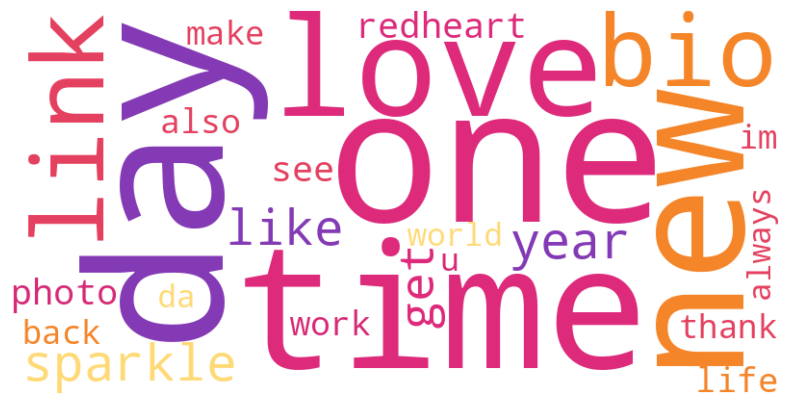

In [ ]:

nltk.download('stopwords')


stopwords_eng = set(stopwords.words('english') + stopwords.words('spanish'))

all_captions = ' '.join(df_copia['clean_caption'].astype(str))




def instagram_color_func(word, font_size, position, orientation, random_state=None, **kwargs):

    if random_state is None:
        random_state = random.Random()
    return instagram_colors[random_state.randint(0, len(instagram_colors) - 1)]

wordcloud = WordCloud(
    stopwords=stopwords_eng,
    background_color="white",
    width=800,
    height=400,
    max_words=25,
    color_func=instagram_color_func
).generate(all_captions)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


La generación de una nube de palabras ha revelado las palabras más frecuentes en los captions analizados.
Sin embargo, el análisis del impacto del texto de los captions, ya sea el largo o el sentimiento en funcion al nivel de engagement no ha mostrado resultados concluyentes que sugieran una influencia significativa

**Engagement segun el momento de la publicacion**
--

In [ ]:

avg_engagement_by_day = df_copia.groupby('day_of_week')['engagement_rate'].mean().reset_index()

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
avg_engagement_by_day['day_of_week'] = pd.Categorical(avg_engagement_by_day['day_of_week'], categories=day_order, ordered=True)
avg_engagement_by_day = avg_engagement_by_day.sort_values('day_of_week')
fig_day = px.bar(avg_engagement_by_day,
                 x='day_of_week',
                 y='engagement_rate',
                 title='Engagement Promedio por Día de la Semana',
                 labels={'engagement_rate': 'Engagement Promedio', 'day_of_week': 'Día de la Semana'},
                 color='day_of_week',
                 color_discrete_sequence=instagram_colors)

fig_day.show()


In [ ]:

days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_copia['day_of_week'] = pd.Categorical(df_copia['day_of_week'], categories=days_order, ordered=True)
avg_engagement_by_day_hour = df_copia.groupby(['day_of_week', 'hour_of_day'])['engagement_rate'].mean().reset_index()
fig = px.bar(avg_engagement_by_day_hour,
             x='hour_of_day',
             y='engagement_rate',
             color='day_of_week',
             title='Engagement Promedio por Hora del Día y Día de la Semana',
             labels={'engagement_rate': 'Engagement Promedio', 'hour_of_day': 'Hora del Día'},
             color_discrete_sequence=instagram_colors)
fig.update_layout(barmode='group',
                  xaxis_title='Hora del Día',
                  yaxis_title='Engagement Promedio',
                  legend_title_text='Día de la Semana',
                  title_x=0.5)
fig.show()


In [ ]:
avg_engagement_by_hour = df_copia.groupby('hour_of_day')['engagement_rate'].mean().reset_index()
fig_hour = px.bar(avg_engagement_by_hour,
                  x='hour_of_day',
                  y='engagement_rate',
                  title='Engagement Promedio por Hora del Día',
                  labels={'engagement_rate': 'Engagement Promedio', 'hour_of_day': 'Hora del Día'},
                  color_discrete_sequence=instagram_colors
                 )

fig_hour.show()


Para responder a la pregunta sobre el mejor momento para publicar y si existen días u horarios que generan mayor engagement, se realizaron varios análisis gráficos. En primer lugar, al observar el engagement promedio por día de la semana, no se detectaron diferencias significativas en el nivel de engagement entre los días. Sin embargo, se destacó una ligera ventaja los jueves, sábados y domingos en comparación con los demás días.

Posteriormente, se utilizó un gráfico de engagement promedio por hora y día de la semana. Aunque a primera vista parece contener mucha información, este gráfico permite filtrar por día específico y realizar comparaciones detalladas del engagement por franja horaria, lo que facilita un análisis más granular.

Finalmente, considerando que las diferencias entre los días de la semana fueron mínimas, se analizó el engagement promedio por hora de publicación. Los resultados indican que los horarios con mayor nivel de engagement son las 13:00 hs, la 01:00 am y las 21:00 hs, lo que sugiere que estos momentos podrían ser los más efectivos para publicar contenido, independientemente del día de la semana.


**Relacion del engagement con la cantidad de seguidores**
--

In [ ]:

fig = px.scatter(df_copia,
                 x='followers',
                 y='engagement_rate',
                 trendline='ols',
                 title='Relación entre Número de Seguidores y Engagement Rate',
                 labels={'followers': 'Número de Seguidores', 'engagement_rate': 'Engagement Rate'},
                 color='engagement_rate',
                 color_continuous_scale='Sunset')

fig.show()


In [ ]:

fig = px.scatter(df_copia,
                 x='following',
                 y='engagement_rate',
                 trendline='ols',
                 title='Relación entre Número de Seguidos y Engagement Rate',
                 labels={'following': 'Número de Seguidos', 'engagement_rate': 'Engagement Rate'},
                 color='engagement_rate',
                 color_continuous_scale='Sunset')

fig.show()


<ipython-input-75-1254a5b671b7>:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




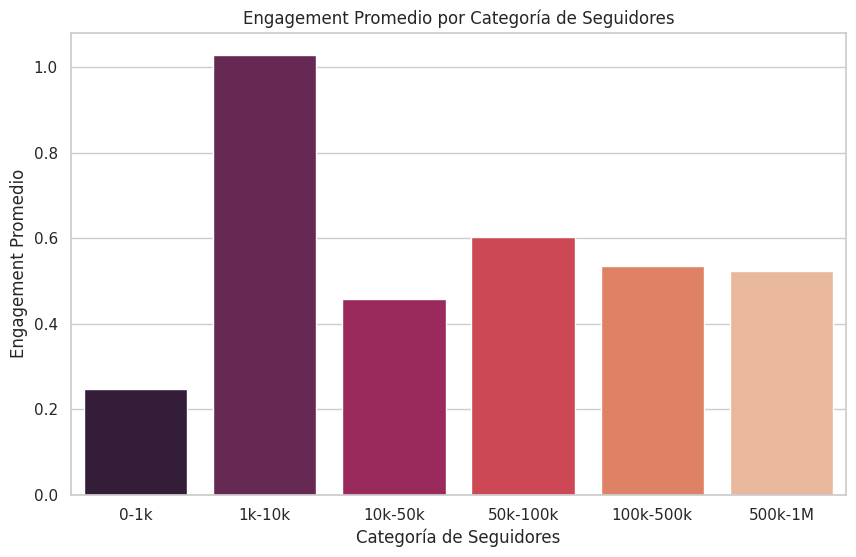

In [ ]:

df_copia['followers_category'] = pd.cut(df_copia['followers'],
                                        bins=[0, 1000, 10000, 50000, 100000, 500000, 1000000],
                                        labels=['0-1k', '1k-10k', '10k-50k', '50k-100k', '100k-500k', '500k-1M'])

avg_engagement_by_followers = df_copia.groupby('followers_category')['engagement_rate'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(x='followers_category', y='engagement_rate', data=avg_engagement_by_followers, palette='rocket')
plt.title('Engagement Promedio por Categoría de Seguidores')
plt.xlabel('Categoría de Seguidores')
plt.ylabel('Engagement Promedio')
plt.show()


<ipython-input-76-61ee835b3cef>:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




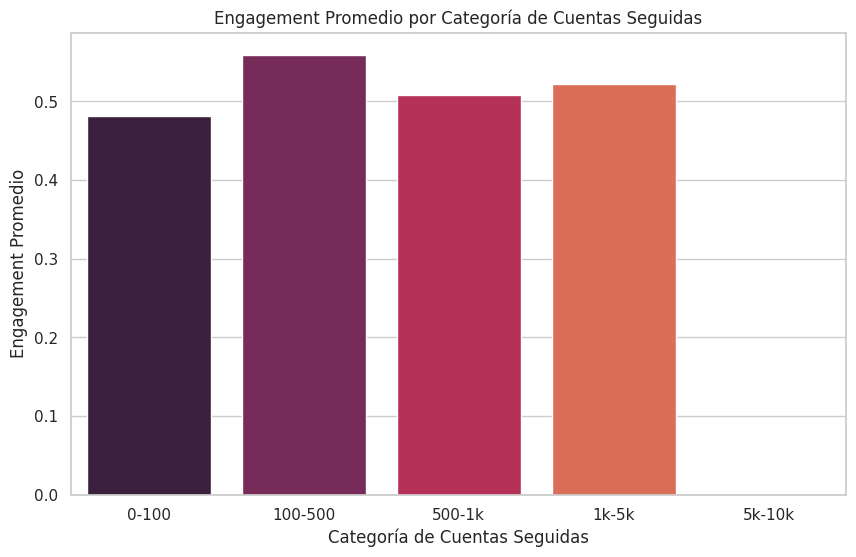

In [ ]:

df_copia['following_category'] = pd.cut(df_copia['following'],
                                        bins=[0, 100, 500, 1000, 5000, 10000],
                                        labels=['0-100', '100-500', '500-1k', '1k-5k', '5k-10k'])

avg_engagement_by_following = df_copia.groupby('following_category')['engagement_rate'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(x='following_category', y='engagement_rate', data=avg_engagement_by_following, palette='rocket')
plt.title('Engagement Promedio por Categoría de Cuentas Seguidas')
plt.xlabel('Categoría de Cuentas Seguidas')
plt.ylabel('Engagement Promedio')
plt.show()


En el análisis de la relación entre el engagement rate y el número de seguidores, se observó una ligera tendencia negativa. Esto indica que, en general, las cuentas con un mayor número de seguidores tienden a tener un engagement rate algo más bajo. En contraste, la relación entre el engagement rate y el número de cuentas que se siguen muestra una tendencia más estable, sin variaciones significativas en el engagement rate con respecto a las categorías de "following".

Al categorizar las variables "followers" y "following", se identificó que las cuentas en el rango de 1,000 a 10,000 seguidores obtienen el mayor nivel de engagement. Este rango de seguidores parece ser el más eficaz en términos de interacción con el contenido. Por otro lado, en relación con la variable "following", no se detectaron diferencias significativas en el nivel de engagement entre las distintas categorías.

En resumen, las cuentas con un rango de seguidores entre 1k y 10k tienden a tener un mayor nivel de engagement. La cantidad de cuentas que una cuenta sigue no muestra una relación clara con el engagement, sugiriendo que seguir más cuentas no necesariamente resulta en una mayor interacción con el contenido.

#**Matriz de correlacion de variables**

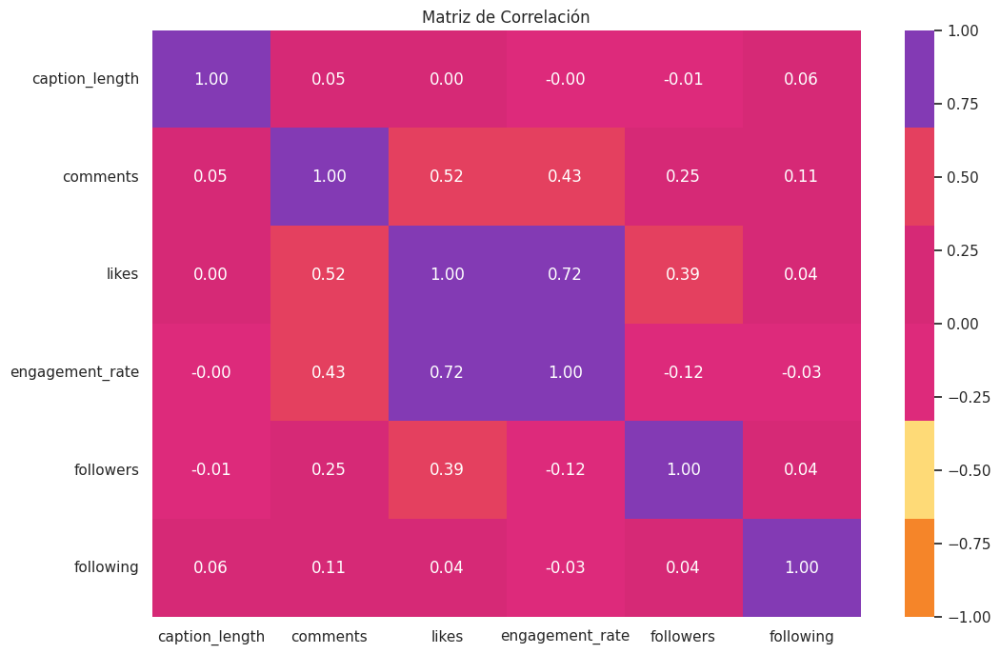

In [ ]:


numerical_cols = ['caption_length', 'comments', 'likes', 'engagement_rate', 'followers', 'following']
df_numerical = df_copia[numerical_cols]

correlation_matrix = df_numerical.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap=instagram_colors, fmt='.2f', vmin=-1, vmax=1)
plt.title('Matriz de Correlación')
plt.show()


La matriz de correlación muestra una alta correlación positiva entre el engagement rate y los likes, indicando que a medida que aumentan los likes, también tiende a aumentar el engagement rate.
Además, se observa una correlación positiva moderada entre los likes y los comments, así como entre los likes y los followers. Esto sugiere que mayores cantidades de likes están asociadas con un mayor número de comments y followers. En contraste, la correlación entre las demás variables es baja o nula, indicando relaciones menos significativas en esos casos.

# **Analisis adicionales**

In [ ]:
instagram_colors = ['#F58529', '#833AB4', '#FEDA77', '#DD2A7B', '#D62976', '#E4405F']

fig_likes = px.scatter(df_copia,
                       x='likes',
                       y='engagement_rate',
                       color='engagement_rate_category',
                       trendline='ols',
                       title="Relación entre Likes y Engagement Rate (Categorías) con Línea de Tendencia",
                       labels={'likes': 'Cantidad de Likes', 'engagement_rate': 'Engagement Rate', 'engagement_rate_category': 'Categoría de Engagement'},
                       color_discrete_sequence=instagram_colors)

fig_likes.show()




In [ ]:

fig_comments = px.scatter(df_copia,
                          x='comments',
                          y='engagement_rate',
                          color='engagement_rate_category',
                          trendline='ols',
                          title="Relación entre Comentarios y Engagement Rate (Categorías) con Línea de Tendencia",
                          labels={'comments': 'Cantidad de Comentarios', 'engagement_rate': 'Engagement Rate', 'engagement_rate_category': 'Categoría de Engagement'},
                          color_discrete_sequence=instagram_colors)

fig_comments.show()



In [ ]:
fig = px.scatter(df_copia,
                 x='followers',
                 y='likes',
                 title='Relación entre Número de Seguidores y Likes',
                 trendline="ols",
                 trendline_color_override='red',
                 labels={'followers': 'Número de Seguidores', 'likes': 'Likes'},
                 color ='likes',
                 color_continuous_scale=px.colors.sequential.Sunset)

fig.show()



In [ ]:

avg_likes_by_hour = df_copia.groupby('hour_of_day')['likes'].mean().reset_index()

max_likes_hour = avg_likes_by_hour.loc[avg_likes_by_hour['likes'].idxmax()]

fig = px.bar(avg_likes_by_hour,
             x='hour_of_day',
             y='likes',
             title='Relación entre Hora de Publicación y Likes',
             labels={'hour_of_day': 'Hora del Día', 'likes': 'Likes'},
             color='likes',
             color_continuous_scale='sunset')


fig.add_vline(x=max_likes_hour['hour_of_day'],
              line_dash="dash",
              line_color="violet",
              line_width=2,
              annotation_text=f"Mayor Cantidad de Likes\n{int(max_likes_hour['likes'])}",
              annotation_position="top right",
              annotation_font_size=12,
              annotation_font_color="red")

fig.update_layout(
    xaxis_title='Hora del Día',
    yaxis_title='Likes',
    title_font_size=16,
    xaxis=dict(tickmode='linear'),
    yaxis=dict(title_standoff=25),
    plot_bgcolor='white'
)


fig.show()




In [ ]:

likes_by_type = df_copia.groupby('tipo_publicacion')['likes'].sum().reset_index()

fig_pie = px.pie(likes_by_type,
                 names='tipo_publicacion',
                 values='likes',
                 title='Proporción de Likes por Tipo de Publicación',
                 color='tipo_publicacion',
                 color_discrete_sequence=instagram_colors)

fig_pie.update_layout(
    title_font_size=16,
    plot_bgcolor='white',
    legend_title='Tipo de Publicación',
    legend_title_font_size=14
)

fig_pie.update_traces(
    textinfo='percent+label',
    textfont_size=14,
    textfont_color='white',
    texttemplate='%{percent:.1%}'
)

fig_pie.show()






Se realizaron análisis adicionales debido a que muchas de las hipótesis planteadas no se cumplieron o las preguntas clave no arrojaron datos relevantes. En primer lugar, se analizó la relación entre "likes" y el "engagement rate", así como entre el "engagement rate" y los "comments". Se observó que los "likes" tienen un mayor impacto en el "engagement rate" que los "comments", ya que la tendencia positiva es más pronunciada con los "likes".

Posteriormente, se examinó el "engagement rate" por usuario y se descubrió que la mayoría de las cuentas que componen el conjunto de datos presentan un bajo nivel de "engagement" en sus publicaciones. Además, se realizó un análisis de la relación entre "likes" y "followers", que mostró una tendencia positiva. Esto contrasta con el gráfico del análisis de "engagement rate" frente a los "followers".

En el análisis del horario de publicación versus los "likes", se observó que el mayor nivel de "likes" se alcanza alrededor de las 13:00 horas. Finalmente, en cuanto al tipo de publicación, las publicaciones con múltiples imágenes obtuvieron el 42% de los "likes".


# **Conclusión Final del Análisis Exploratorio de Datos (EDA)**



El análisis de los datos de Instagram ha llevado a las siguientes conclusiones:

- Tipo de Publicación y Engagement: Las publicaciones con múltiples imágenes generan el mayor engagement promedio, seguidas por las imágenes simples, mientras que los videos tienen los valores más bajos de interacción.

- Longitud del Texto y Sentimiento: La longitud del texto y el sentimiento de los captions no muestran un impacto significativo en el engagement. Los textos extremadamente largos tienden a tener un engagement más bajo, pero ni la longitud ni el sentimiento del texto parecen variar mucho el engagement.

- Momento Óptimo para Publicar: Los horarios con mayor engagement son a las 13:00, 01:00 y 21:00. No se encontraron diferencias significativas en el engagement entre los días de la semana, aunque los jueves, sábados y domingos muestran una ligera ventaja.

- Relación entre Followers y Engagement: Las cuentas con entre 1,000 y 10,000 seguidores presentan el mayor engagement. A medida que aumenta el número de seguidores, el engagement rate tiende a disminuir ligeramente. La cantidad de cuentas seguidas no muestra una relación clara con el engagement.

- Correlaciones: Se observa una fuerte correlación positiva entre el engagement rate y los likes, y una correlación moderada entre likes y comments, así como entre likes y followers. Esto indica que un mayor número de likes está asociado con un mayor engagement y más comments.

- Análisis Adicional: Se identificó que los likes tienen un impacto más pronunciado en el engagement rate que los comments. La mayoría de las cuentas muestran un bajo nivel de engagement en sus publicaciones. Además, se observó una tendencia positiva en la relación entre likes y followers. El mayor número de likes se obtiene alrededor de las 13:00 horas, y las publicaciones con múltiples imágenes reciben el 42% de los likes.

**En resumen, las publicaciones con múltiples imágenes son las más efectivas para generar engagement, y los mejores horarios para publicar son a las 13:00, 01:00 y 21:00. Las cuentas con 1,000 a 10,000 seguidores tienen el mayor engagement, y los likes tienen un mayor impacto en el engagement que los comments. La longitud del texto y el sentimiento del caption no parecen influir significativamente en el engagement.**

# **Siguientes Lineas del Proyecto**



Con base en los hallazgos del análisis exploratorio de datos (EDA), el siguiente paso en este proyecto podría ser la implementación de modelos predictivos para mejorar la estrategia de publicación en Instagram. Estos modelos pueden ayudar a identificar qué tipo de publicaciones podrían obtener mejores resultados en términos de engagement y likes

 - Modelos de Regresión :

      **Objetivo**: Predecir el número de likes o el engagement rate de futuras publicaciones

      **Enfoque**: Utilizar modelos de regresión, como la regresión lineal o regresión de árboles de decisión, para modelar la relación entre las características de las publicaciones (tipo de contenido, longitud del texto, hora de publicación, etc.) y el número de likes o el engagement rate.

-  Modelos de Clasificación:

      **Objetivo**: Clasificar las publicaciones en categorías de engagement basadas en sus características.

      **Enfoque**: Implementar modelos de clasificación, como árboles de decisión, Random Forest, o Support Vector Machines (SVM), para predecir la categoría de engagement de las publicaciones.
  


# APLICACION DE ALGORITMOS DE MACHINE LEARNING

# MODELOS DE CLASIFICACION

Se implementaran  modelos de clasificacion para buscar predecir el rango del engagement, en busca del algoritmo que arroje resultados mas precisos

RANGOS DE ENGAMENT

*   0 a 0.2 bajo
*   0.21 a 0.5 Medio
*   0.51 a 1 Alto
*   Mayor a 1 Muy alto





# Carga librerias para ML

In [ ]:

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import RepeatedStratifiedKFold, RandomizedSearchCV, GridSearchCV, train_test_split
from scipy.stats import loguniform
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc


from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
import lightgbm as lgb



import warnings
warnings.filterwarnings('ignore')


In [ ]:
# Seleccionar columnas para el DataFrame de clasificación
df_clf = df_copia[['hour_of_day', 'day_of_week', 'engagement_rate_category', 'tipo_publicacion', 'following']]


In [ ]:
# Aplicar LabelEncoder a las columnas seleccionadas

df_clf_encoded = df_clf.copy()
le = LabelEncoder()
df_clf_encoded['day_of_week'] = le.fit_transform(df_clf_encoded['day_of_week'])
df_clf_encoded['engagement_rate_category'] = le.fit_transform(df_clf_encoded['engagement_rate_category'])
df_clf_encoded['tipo_publicacion'] = le.fit_transform(df_clf_encoded['tipo_publicacion'])
df_clf_encoded.head()


,hour_of_day,day_of_week,engagement_rate_category,tipo_publicacion,following
12,4,2,1,0,669.0
13,8,6,0,1,669.0
14,12,5,3,1,669.0
15,9,5,2,1,669.0
16,12,5,0,1,669.0


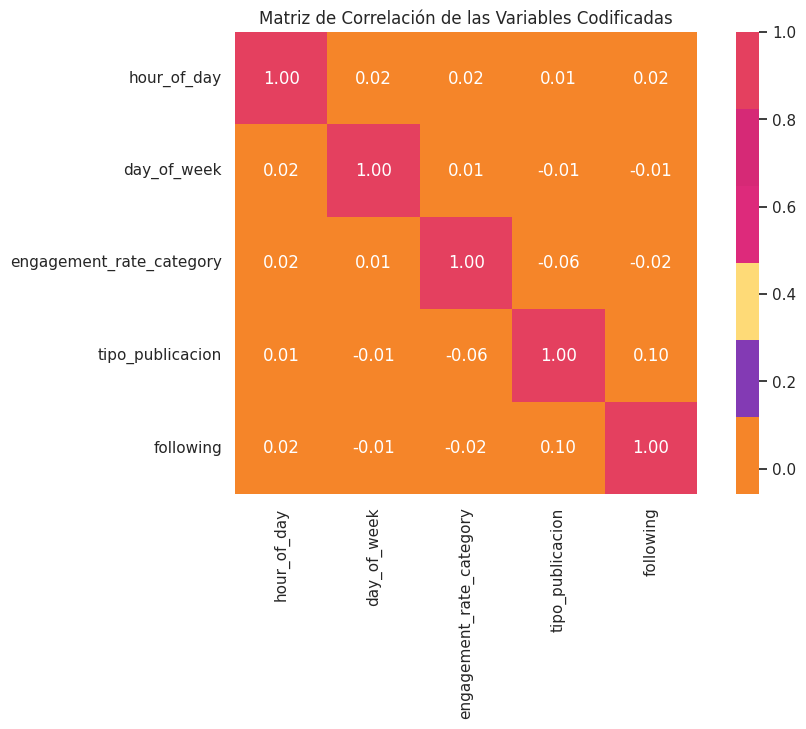

In [ ]:
correlation_matrix = df_clf_encoded.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap=sns.color_palette(instagram_colors), fmt=".2f", square=True)
plt.title("Matriz de Correlación de las Variables Codificadas")
plt.show()


In [ ]:
X = df_clf_encoded.drop(columns=['engagement_rate_category']) # para entrenar
X.head()

,hour_of_day,day_of_week,tipo_publicacion,following
12,4,2,0,669.0
13,8,6,1,669.0
14,12,5,1,669.0
15,9,5,1,669.0
16,12,5,1,669.0


In [ ]:
y = df_clf_encoded['engagement_rate_category'] # variable target
y

,engagement_rate_category
12,1
13,0
14,3
15,2
16,0
...,...
11686,1
11687,2
11688,2
11689,3


In [ ]:
# Dividir en train y test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
y_test.info()

<class 'pandas.core.series.Series'>
Int64Index: 1279 entries, 10080 to 4926
Series name: engagement_rate_category
Non-Null Count  Dtype
--------------  -----
1279 non-null   int64
dtypes: int64(1)
memory usage: 20.0 KB


In [ ]:
# evaluar la importancia de las Features
clf = RandomForestClassifier(random_state = 42)
clf = clf.fit(X, y)


In [ ]:
clf.feature_importances_

array([0.26444709, 0.15343103, 0.03010781, 0.55201408])

In [ ]:
fimp = pd.Series(data=clf.feature_importances_, index=X.columns).sort_values(ascending=True)

In [ ]:
fimp_df = pd.DataFrame({
    'Feature': fimp.index,
    'Importance': fimp.values
})

In [ ]:
fig = px.bar(
    fimp_df,
    x='Importance',
    y='Feature',
    orientation='h',
    title="Feature Importance",
    color='Feature',
    color_discrete_sequence=instagram_colors
)

fig.update_layout(
    width=800,
    height=600
)

fig.show()

# Evaluacion y seleccion del modelo de ML

In [ ]:
# Aplicacion y comparativa de distintos modelos de clasificacion
classification_models = {
    "Logistic Regression": LogisticRegression(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Support Vector Machine": SVC(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
}

model_names = []
accuracies = []

# Entrenamiento y evaluacion
for name, clf in classification_models.items():
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    model_names.append(name)
    accuracies.append(score)
    #print(f"{name} accuracy: {score:.2f}")

In [ ]:
df_models = pd.DataFrame({'Model': model_names, 'Accuracy': accuracies})
fig = px.bar(df_models, x='Model', y='Accuracy', title='Accuracies de los Modelos aplicados',
             color='Model', color_discrete_sequence=instagram_colors)
fig.show()

In [ ]:
best_index = accuracies.index(max(accuracies))
best_model_name = model_names[best_index]
best_model = classification_models[best_model_name]

print(f"El mejor modelo es: {best_model_name} con un Accuracy de  {(accuracies[best_index]*100):.2f}%")

El mejor modelo es: Decision Tree con un Accuracy de  59.11%


# DECISION TREE

Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.54      0.53       248
           1       0.67      0.67      0.67       464
           2       0.52      0.53      0.52       346
           3       0.60      0.57      0.58       221

    accuracy                           0.59      1279
   macro avg       0.58      0.57      0.58      1279
weighted avg       0.59      0.59      0.59      1279

Confusion Matrix:
[[134  34  48  32]
 [ 47 309  88  20]
 [ 52  81 182  31]
 [ 27  36  33 125]]


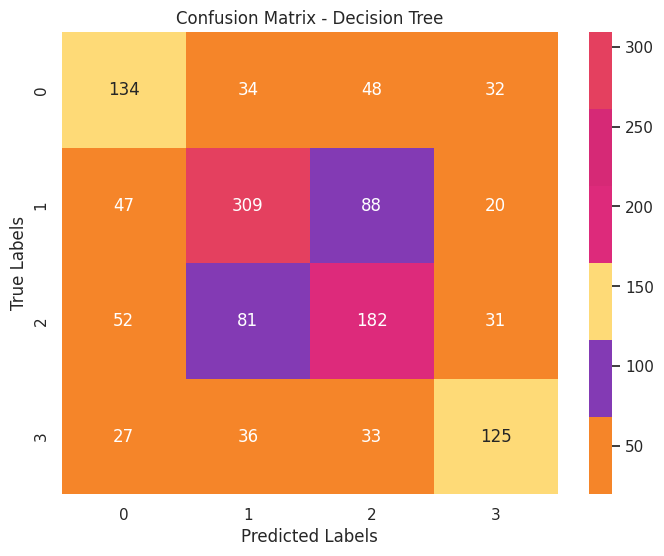

In [ ]:
decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train, y_train)


y_pred = decision_tree.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

instagram_colors = ['#F58529', '#833AB4', '#FEDA77', '#DD2A7B', '#D62976', '#E4405F']

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap=sns.color_palette(instagram_colors), xticklabels=decision_tree.classes_, yticklabels=decision_tree.classes_)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix - Decision Tree")
plt.show()


# OPTIMIZACION DE HIPERPARAMETROS DEL MODELO DE CLASIFICACION

Best Parameters: {'max_depth': 40, 'min_samples_leaf': 1, 'min_samples_split': 2}
Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.52      0.51       248
           1       0.68      0.67      0.68       464
           2       0.53      0.53      0.53       346
           3       0.60      0.58      0.59       221

    accuracy                           0.59      1279
   macro avg       0.58      0.58      0.58      1279
weighted avg       0.59      0.59      0.59      1279

Confusion Matrix:
[[129  32  48  39]
 [ 50 312  84  18]
 [ 54  79 184  29]
 [ 25  33  34 129]]


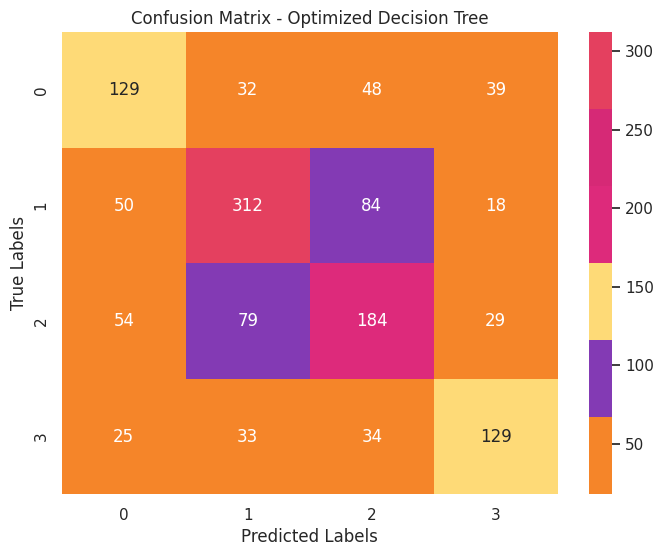

In [ ]:
param_grid = {
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

best_tree = grid_search.best_estimator_
y_pred_optimized = best_tree.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred_optimized))

cm_optimized = confusion_matrix(y_test, y_pred_optimized)
print("Confusion Matrix:")
print(cm_optimized)


plt.figure(figsize=(8, 6))
sns.heatmap(cm_optimized, annot=True, fmt="d",  cmap=sns.color_palette(instagram_colors), xticklabels=best_tree.classes_, yticklabels=best_tree.classes_)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix - Optimized Decision Tree")
plt.show()


# METODO DE ENSAMBLE : BAGGING

Classification Report - Bagging:
              precision    recall  f1-score   support

           0       0.54      0.53      0.54       248
           1       0.69      0.69      0.69       464
           2       0.55      0.56      0.55       346
           3       0.62      0.61      0.61       221

    accuracy                           0.61      1279
   macro avg       0.60      0.60      0.60      1279
weighted avg       0.61      0.61      0.61      1279

Confusion Matrix - Bagging:
[[132  35  48  33]
 [ 39 321  83  21]
 [ 46  78 194  28]
 [ 27  30  30 134]]


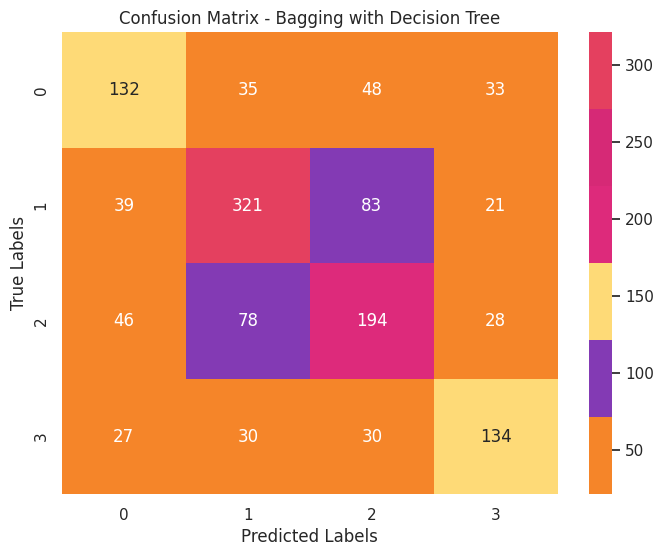

In [ ]:

bagging_clf = BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=grid_search.best_params_['max_depth']),
                                n_estimators=100, random_state=42)
bagging_clf.fit(X_train, y_train)
y_pred_bagging = bagging_clf.predict(X_test)

print("Classification Report - Bagging:")
print(classification_report(y_test, y_pred_bagging))


cm_bagging = confusion_matrix(y_test, y_pred_bagging)
print("Confusion Matrix - Bagging:")
print(cm_bagging)


plt.figure(figsize=(8, 6))
sns.heatmap(cm_bagging, annot=True, fmt="d", cmap=sns.color_palette(instagram_colors))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix - Bagging with Decision Tree")
plt.show()



# VALIDACION CRUZADA

In [ ]:
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted')
}


cv_results = cross_validate(bagging_clf, X, y, cv=5, scoring=scoring)

print("Cross-Validation Results (Bagging with Decision Tree):")
print(f"Average Accuracy: {cv_results['test_accuracy'].mean():.2f}")
print(f"Average Precision: {cv_results['test_precision'].mean():.2f}")
print(f"Average Recall: {cv_results['test_recall'].mean():.2f}")
print(f"Average F1 Score: {cv_results['test_f1'].mean():.2f}")


Cross-Validation Results (Bagging with Decision Tree):
Average Accuracy: 0.60
Average Precision: 0.60
Average Recall: 0.60
Average F1 Score: 0.60


# APLICACION DE GRADIENT BOOSTING INTENTANDO MEJORAR LAS METRICAS

In [ ]:

gb_param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.5],
}
gb_grid = GridSearchCV(GradientBoostingClassifier(), gb_param_grid, cv=5, scoring='accuracy')
gb_grid.fit(X_train, y_train)


y_pred_gb_best = gb_grid.predict(X_test)
print("Mejores parámetros de Gradient Boosting:", gb_grid.best_params_)
print("Classification Report - Mejor Gradient Boosting:")
print(classification_report(y_test, y_pred_gb_best))
cm = confusion_matrix(y_test, y_pred_gb_best)
print("Confusion Matrix - Mejor Gradient Boosting:")
print(cm)



Mejores parámetros de Gradient Boosting: {'learning_rate': 0.5, 'max_depth': 5, 'n_estimators': 100}
Classification Report - Mejor Gradient Boosting:
              precision    recall  f1-score   support

           0       0.54      0.54      0.54       248
           1       0.70      0.77      0.73       464
           2       0.58      0.55      0.56       346
           3       0.70      0.61      0.65       221

    accuracy                           0.64      1279
   macro avg       0.63      0.62      0.62      1279
weighted avg       0.63      0.64      0.63      1279

Confusion Matrix - Mejor Gradient Boosting:
[[133  48  42  25]
 [ 35 357  61  11]
 [ 55  79 189  23]
 [ 25  27  34 135]]


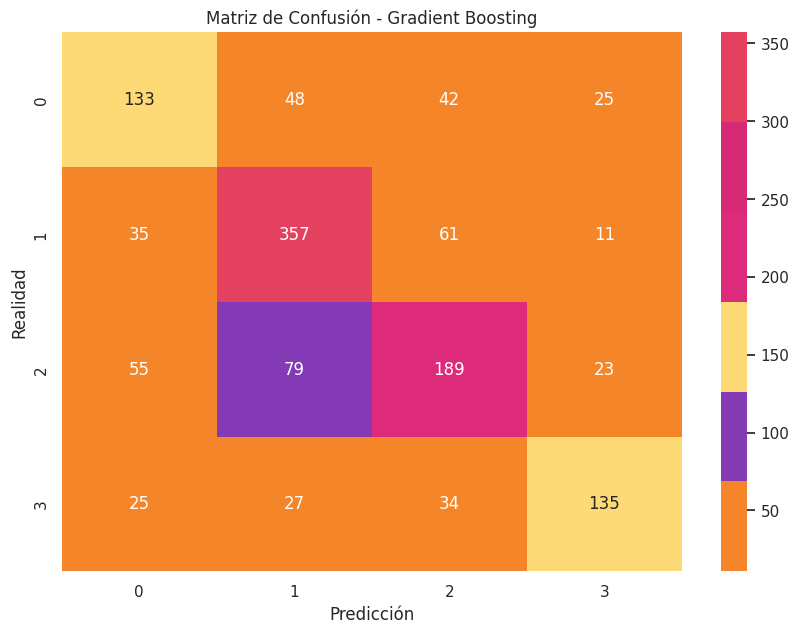

In [ ]:
# Configurar la visualización
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap=sns.color_palette(instagram_colors), xticklabels=['0', '1', '2', '3'], yticklabels=['0', '1', '2', '3'])
plt.xlabel('Predicción')
plt.ylabel('Realidad')
plt.title('Matriz de Confusión - Gradient Boosting')
plt.show()


In [ ]:
y_pred_gb_best = gb_grid.predict(X_test)
y_prob_gb_best = gb_grid.predict_proba(X_test)



# CURVAS ROC PARA GRADIENT BOOSTING

In [ ]:
#instagram_colors = ['#F58529', '#833AB4', '#FEDA77', '#DD2A7B', '#D62976', '#E4405F']

fpr = {}
tpr = {}
roc_auc = {}
n_classes = 4


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_prob_gb_best[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# DataFrame para almacenar las curvas ROC de todas las clases
roc_data = []
for i in range(n_classes):
    temp_df = pd.DataFrame({
        'FPR': fpr[i],
        'TPR': tpr[i],
        'Clase': f'Clase {i} (AUC = {roc_auc[i]:.2f})'
    })
    roc_data.append(temp_df)
roc_df = pd.concat(roc_data, ignore_index=True)


fig = px.line(roc_df, x='FPR', y='TPR', color='Clase',
              title='Curvas ROC para Gradient Boosting',
              color_discrete_sequence=instagram_colors)

fig.add_shape(
    type='line', line=dict(dash='dash', color='gray'),
    x0=0, y0=0, x1=1, y1=1
)

fig.update_layout(
    title='Curvas ROC para Gradient Boosting',
    xaxis_title='Tasa de Falsos Positivos',
    yaxis_title='Tasa de Verdaderos Positivos',
    legend_title_text='Clases'
)
fig.show()


RESULTADOS OBTENIDOS

- CLase 0 AUC 0.81
- Clase 1 AUC 0.87
- Clase 2 AUC 0.79
- Clase 3 AUC 0.86

# Resumen de pasos realizados - MODELO DE CLASIFICACION

Se desarrolló un análisis completo para predecir el rango de engagement en Instagram, categorizado en cuatro niveles: bajo, medio, alto y muy alto. Para este análisis, se seleccionaron variables clave como la hora del día, día de la semana, tipo de publicación y número de seguidores, aplicando Label Encoding en variables categóricas y dividiendo los datos en conjuntos de entrenamiento y prueba (80%-20%).

Se implementaron varios modelos de clasificación, incluyendo Random Forest, Regresión Logística, K-Nearest Neighbors, SVM, y Decision Tree, evaluando su rendimiento en precisión mediante la métrica accuracy. La importancia de las variables demostró que el número de seguidores fue el factor más influyente en la predicción de engagement.

El modelo con mayor rendimiento fue el Decision Tree (CERCA DE 60% de accuracy), mejorado posteriormente con Grid Search para optimización y técnicas de Bagging y Gradient Boosting, alcanzando hasta 64% de accuracy en el caso de Gradient Boosting.

Los resultados de validación cruzada indicaron que el rendimiento general de estos modelos es consistente pero podría mejorarse. La precisión media de 60% sugiere explorar otras opciones de clasificación y, de no mejorar, evaluar algoritmos de regresión para la predicción de engagement.

Finalmente, se evaluó la curva ROC por clase, mostrando buenos resultados con AUC de 0.79 a 0.87.



# Conclusion PARCIAL
El análisis de los modelos de clasificación ha mostrado un rendimiento prometedor, aunque el accuracy máximo alcanzado del 62% aún está por debajo de lo esperado. Esto sugiere la posibilidad de implementar modelos de regresión como complemento, en un intento por optimizar las métricas y encontrar un enfoque más adecuado para la predicción de engagement. Sin embargo, no se descarta completamente la clasificación; se evaluará al final del análisis si los modelos de regresión aportan una ventaja significativa o si conviene continuar ajustando los modelos de clasificación existentes.

# MODELOS DE REGRESION





In [ ]:
#Seleccion de variables para aplicar el modelo de regresion
df_reg = df_copia[['hour_of_day', 'day_of_week', 'engagement_rate', 'tipo_publicacion', 'following']]

In [ ]:
#encodeo de variables
df_reg_encoded = df_reg.copy()

le = LabelEncoder()
df_reg_encoded['day_of_week'] = le.fit_transform(df_reg_encoded['day_of_week'])
df_reg_encoded['tipo_publicacion'] = le.fit_transform(df_reg_encoded['tipo_publicacion'])
df_reg_encoded.head()

,hour_of_day,day_of_week,engagement_rate,tipo_publicacion,following
12,4,2,0.126315,0,669.0
13,8,6,0.716309,1,669.0
14,12,5,1.451447,1,669.0
15,9,5,0.264399,1,669.0
16,12,5,0.528013,1,669.0


In [ ]:
df_reg_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6394 entries, 12 to 11690
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   hour_of_day       6394 non-null   int64  
 1   day_of_week       6394 non-null   int64  
 2   engagement_rate   6394 non-null   float64
 3   tipo_publicacion  6394 non-null   int64  
 4   following         6394 non-null   float64
dtypes: float64(2), int64(3)
memory usage: 299.7 KB


In [ ]:
# Definir x e y
X_reg = df_reg_encoded.drop('engagement_rate', axis=1)
y_reg = df_reg_encoded['engagement_rate']

In [ ]:
# Dividir en conjuntos de entrenamiento y prueba
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_reg, y_reg, test_size=0.2, random_state=42)

In [ ]:

scaler = StandardScaler()

x_train_scaled = scaler.fit_transform(X_train_reg)

X_test_scaled = scaler.transform(X_test_reg)

# Definir los modelos
models_reg = {
    "Regresión Lineal": LinearRegression(),
    "RandomForestRegressor": RandomForestRegressor(),
    "SVR": SVR(),
    "GradientBoostingRegressor": GradientBoostingRegressor(),
}

# Entrenar y evaluar los modelos
results = {}
for name, model in models_reg.items():
    model.fit(X_train_reg, y_train_reg)
    y_pred_reg = model.predict(X_test_reg)
    results[name] = {
        'MAE': mean_absolute_error(y_test_reg, y_pred_reg),
        'MSE': mean_squared_error(y_test_reg, y_pred_reg),
        'R²': r2_score(y_test_reg, y_pred_reg),

        }

results_df = pd.DataFrame(results).T
print(results_df)


                                MAE       MSE        R²
Regresión Lineal           0.407761  0.271694  0.021387
RandomForestRegressor      0.275375  0.167732  0.395848
SVR                        0.376038  0.305287 -0.099615
GradientBoostingRegressor  0.364598  0.227655  0.180011


In [ ]:

results = {
    "Modelo": [
        "Regresión Lineal",
        "RandomForestRegressor",
        "SVR",
        "GradientBoostingRegressor"
    ],
    "MAE": [0.407761, 0.274118, 0.376038, 0.364697],
    "MSE": [0.271694, 0.165908, 0.305287, 0.227748],
    "R²": [0.021387, 0.402415, -0.099615, 0.179674]
}

results_df = pd.DataFrame(results)

fig = px.bar(results_df.melt(id_vars='Modelo',
                               value_vars=['MAE', 'MSE', 'R²'],
                               var_name='Métrica',
                               value_name='Valor'),
             x='Modelo',
             y='Valor',
             color='Métrica',
             color_discrete_sequence=instagram_colors,
             barmode='group',
             title='Comparación de Modelos de Regresión',
             labels={'Valor': 'Valores de Métricas', 'Modelo': 'Modelos'},
             text='Valor')


fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.update_layout(yaxis_title='Valores de Métricas',
                  xaxis_title='Modelos',
                  yaxis=dict(title=dict(standoff=15)))
fig.show()


# Elección del RandomForestRegressor

***MAE (Mean Absolute Error):***

Valor para RandomForest: 0.274118, que es el más bajo entre los modelos comparados, lo que sugiere que este modelo hace predicciones más precisas en promedio.

***MSE (Mean Squared Error):***
Valor para RandomForest: 0.165908, nuevamente el más bajo, lo que implica que las predicciones son generalmente más cercanas a los valores reales y que el modelo tiene un buen control de los errores.

***R² (Coefficient of Determination):***
Valor para RandomForest: 0.402415, que es significativamente más alto que los demás modelos. Esto sugiere que el modelo explica aproximadamente el 40% de la variabilidad en los datos.

# Mejora de hiperparametros

In [ ]:
rf = RandomForestRegressor()


param_dist = {
    'n_estimators': np.arange(50, 501, 50),
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [None] + list(np.arange(10, 101, 10)),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 11)
}


random_search = RandomizedSearchCV(estimator=rf,
                                   param_distributions=param_dist,
                                   n_iter=200,
                                   scoring='neg_mean_absolute_error',
                                   cv=5
                                   ,
                                   verbose=1,
                                   random_state=42,
                                   n_jobs=1)


random_search.fit(X_train_reg, y_train_reg)


print("Mejores hiperparámetros:", random_search.best_params_)


best_rf = random_search.best_estimator_
y_pred_reg = best_rf.predict(X_test_reg)


mae = mean_absolute_error(y_test_reg, y_pred_reg)
mse = mean_squared_error(y_test_reg, y_pred_reg)
r2 = r2_score(y_test_reg, y_pred_reg)

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"R²: {r2:.4f}")


Fitting 5 folds for each of 200 candidates, totalling 1000 fits
Mejores hiperparámetros: {'n_estimators': 450, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 20}
MAE: 0.2899
MSE: 0.1737
R²: 0.3744


# APLICACION DE METODOS DE ENSAMBLE

Gradient Boosting

In [ ]:

gb_regressor = GradientBoostingRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)
gb_regressor.fit(X_train_reg, y_train_reg)

y_pred_gb = gb_regressor.predict(X_test_reg)

mae_gb = mean_absolute_error(y_test_reg, y_pred_gb)
mse_gb = mean_squared_error(y_test_reg, y_pred_gb)
r2_gb = r2_score(y_test_reg, y_pred_gb)

print(f"Gradient Boosting - MAE: {mae_gb:.4f}, MSE: {mse_gb:.4f}, R²: {r2_gb:.4f}")


Gradient Boosting - MAE: 0.3647, MSE: 0.2277, R²: 0.1797


XGBoost

In [ ]:

xgb_regressor = xgb.XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)
xgb_regressor.fit(X_train_reg, y_train_reg)


y_pred_xgb = xgb_regressor.predict(X_test_reg)


mae_xgb = mean_absolute_error(y_test_reg, y_pred_xgb)
mse_xgb = mean_squared_error(y_test_reg, y_pred_xgb)
r2_xgb = r2_score(y_test_reg, y_pred_xgb)

print(f"XGBoost - MAE: {mae_xgb:.4f}, MSE: {mse_xgb:.4f}, R²: {r2_xgb:.4f}")


XGBoost - MAE: 0.3701, MSE: 0.2325, R²: 0.1626


LightGBM

In [ ]:

lgb_regressor = lgb.LGBMRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)
lgb_regressor.fit(X_train_reg, y_train_reg)

y_pred_lgb = lgb_regressor.predict(X_test_reg)

mae_lgb = mean_absolute_error(y_test_reg, y_pred_lgb)
mse_lgb = mean_squared_error(y_test_reg, y_pred_lgb)
r2_lgb = r2_score(y_test_reg, y_pred_lgb)

print(f"LightGBM - MAE: {mae_lgb:.4f}, MSE: {mse_lgb:.4f}, R²: {r2_lgb:.4f}")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 263
[LightGBM] [Info] Number of data points in the train set: 5115, number of used features: 4
[LightGBM] [Info] Start training from score 0.520559
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

# Comparación de Métricas entre Modelos

In [ ]:


data = {
    'Modelo': [
        'RandomForestRegressor (sin modificar)',
        'RandomForestRegressor (con Random Search)',
        'Gradient Boosting',
        'XGBoost',
        'LightGBM'
    ],
    'MAE': [
        0.273681,  # RandomForestRegressor sin modificar
        0.2893,    # RandomForestRegressor después de Random Search
        0.3647,    # Gradient Boosting
        0.3701,    # XGBoost
        0.3702     # LightGBM
    ],
    'MSE': [
        0.164302,  # RandomForestRegressor sin modificar
        0.1739,    # RandomForestRegressor después de Random Search
        0.2277,    # Gradient Boosting
        0.2325,    # XGBoost
        0.2348     # LightGBM
    ],
    'R²': [
        0.408202,  # RandomForestRegressor sin modificar
        0.3736,    # RandomForestRegressor después de Random Search
        0.1797,    # Gradient Boosting
        0.1626,    # XGBoost
        0.1543     # LightGBM
    ]
}

# Crear el DataFrame
df_results = pd.DataFrame(data)

# Mostrar el DataFrame
df_results


,Modelo,MAE,MSE,R²
0,RandomForestRegressor (sin modificar),0.273681,0.164302,0.408202
1,RandomForestRegressor (con Random Search),0.289300,0.173900,0.373600
2,Gradient Boosting,0.364700,0.227700,0.179700
3,XGBoost,0.370100,0.232500,0.162600
4,LightGBM,0.370200,0.234800,0.154300


In [ ]:

df_long = df_results.melt(id_vars='Modelo', value_vars=['MAE', 'MSE', 'R²'],
                          var_name='Métrica', value_name='Valor')

fig = px.bar(df_long,
             x='Modelo',
             y='Valor',
             color='Métrica',
             barmode='group',
             title='Comparación de Métricas entre Modelos',
             color_discrete_sequence=instagram_colors)

fig.update_layout(
    xaxis_title='Modelo',
    yaxis_title='Valor',
    width=800,
    height=600
)


fig.show()


# **Resumen de pasos realizados MODELOS DE REGRESION**

Se llevó a cabo un proceso estructurado que incluyó la **selección de variables**, donde se identificaron aquellas relevantes para el modelo. Posteriormente, se realizó el **encoding**, transformando las variables categóricas a un formato numérico adecuado mediante **Label Encoding**. A continuación, se definieron las variables independientes (X) y la variable dependiente (y) para la tarea de regresión.

El conjunto de datos se dividió en un 80% para entrenamiento y un 20% para pruebas, asegurando una evaluación robusta del modelo. Se procedió al **escalado de variables**, estandarizando las características numéricas para optimizar el rendimiento de los algoritmos de aprendizaje automático.

Se entrenaron diversos modelos de regresión, incluyendo **Regresión Lineal**, **RandomForestRegressor**, **Support Vector Regression (SVR)** y **GradientBoostingRegressor**. Los resultados de las métricas de desempeño para cada modelo fueron los siguientes:

- **Regresión Lineal**: MAE 0.407761, MSE 0.271694, R² 0.021387
- **RandomForestRegressor**: MAE 0.273681, MSE 0.164302, R² 0.408202
- **SVR**: MAE 0.376038, MSE 0.305287, R² -0.099615
- **GradientBoostingRegressor**: MAE 0.364598, MSE 0.227655, R² 0.180011

A pesar de que el **RandomForestRegressor** no alcanzó métricas ideales, se eligió por su rendimiento superior en comparación con los demás algoritmos. Para mejorar aún más las métricas del **RandomForestRegressor**, se aplicaron técnicas de optimización de hiperparámetros a través de **Random Search**. Además, se probaron otros modelos de ensamble como **Gradient Boosting**, **XGBoost** y **LightGBM**, cuyos resultados fueron menos competitivos. En resumen, el **RandomForestRegressor** (sin modificar) presentó un rendimiento superior en comparación con los demás modelos, incluso después de la optimización.

# COMPARATIVA Y CONCLUSION FINAL

Para comparar los resultados obtenidos del RandomForestRegressor y el Decision Tree (mediante Gradient Boosting), es importante resaltar las métricas clave que se han reportado para cada uno.

**Resultados del RandomForestRegressor**:

*  MAE: 0.273681
*  MSE: 0.164302
*  R²: 0.408202


**Resultados del Decision Tree (Gradient Boosting):**

*Clasificación*:
* Clase 0: Precision 0.53, Recall 0.52, F1-Score 0.53
* Clase 1: Precision 0.70, Recall 0.74, F1-Score 0.72
* Clase 2: Precision 0.56, Recall 0.54, F1-Score 0.55
* Clase 3: Precision 0.68, Recall 0.63, F1-Score 0.66
* Accuracy: 0.63
* Promedio macro: Precision 0.62, Recall 0.61, F1-Score 0.61
* Promedio ponderado: Precision 0.62, Recall 0.63, F1-Score 0.62

*AUC por Clase:*

* Clase 0: AUC 0.80
* Clase 1: AUC 0.87
* Clase 2: AUC 0.79
* Clase 3: AUC 0.87

**COMPARATIVA DE AMBOS MODELOS**

**RandomForestRegressor**

muestra métricas de error (MAE y MSE) que indican un rendimiento en la predicción continua, con un R² de 0.408202, lo que sugiere una capacidad moderada para explicar la variabilidad de la variable dependiente.

**Decision Tree (con Gradient Boosting)**

ofrece un rendimiento diferente, ya que las métricas de precisión, recall y F1-Score reflejan la efectividad del modelo en un contexto de clasificación. La precisión promedio ponderada de 0.62 y la exactitud de 0.63 indican un rendimiento razonable, pero puede haber un área de mejora en las clases menos representadas.

AUC en las clases 1 y 3 sugiere un buen rendimiento del modelo en la clasificación de estas clases, con AUCs de 0.87, mientras que las otras clases presentan AUCs moderados (0.79 y 0.80), lo que indica que el modelo tiene un buen desempeño general en la clasificación.



# **CONCLUSION FINAL**

Dado que el objetivo es proporcionar recomendaciones sobre el tipo de publicación, horario y día en que un usuario debe publicar para maximizar el engagement, considero que el modelo de clasificación Decision Tree es el más adecuado.

Este modelo se alinea con la naturaleza del problema y  permite categorizar las interacciones.

Como mejoras futuras : A medida que se recopilen más datos y se detecten nuevas tendencias en el comportamiento de los seguidores, el modelo podrá adaptarse y mejorar, refinando así las recomendaciones con el tiempo.


Aunque no obtuve métricas "ideales", disfruté mucho realizando este proyecto, que sumaré a mi portfolio, demostrando todos los conocimientos adquiridos. Agradezco mucho al profe y a los tutores por su dedicación y apoyo, que nos motivan a seguir avanzando en este camino hacia la ciencia de los datos. Todavía queda camino por recorrer, pero la cima ya está más cerca. ¡Muchas gracias!